# Identify Human values in Arguments - Main notebook

SemEval 2023 Task 4; ValueEval: Identification of Human Values behind Arguments.

Author: Mathias Cardarello Fierro

*Strategy:* Create an explainable multilabel classification model that can label new argumentation texts with Human values, a subset of 20 values extracted from Kiesel et al. (2022), based on the correlation between the topics discussed in the arguments ("premise") and the descriptions of the values.

1.   Data preprocessing
2.   Topic modelling of the premises using transformers (BERT)
3.   Human Values Correlation analysis
4.   Multi-label classification for predicting Human values for each argument

This involves:
1. Topic Modeling on Argumentation Texts: Extract topics from the argumentation texts.
2. Correlation of Topics with Human Values Descriptions: Use the topics and human values descriptions to find correlations.
3. Classification of Arguments into Human Values: Use the correlation between topics and human values as features for classification.

### 1. Data preprocessing
In this section, we tokenize argumentation texts (premises), remove the stop words and, finally, perform lemmatization (stemming does not seem to be necessary at this point).

In [2]:
## Import basic libraries

import pandas as pd
import os
import glob

import warnings

def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()

import re
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
plt.style.use("fivethirtyeight")
pd.set_option('display.max_colwidth', 80)
import matplotlib.patheffects as path_effects
import nltk
import numpy as np
import seaborn as sns
import gensim

from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from imblearn.over_sampling import RandomOverSampler

from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora import Dictionary
from gensim.models.nmf import Nmf
from operator import itemgetter

from scipy.stats import f_oneway, ttest_ind

nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem import SnowballStemmer
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')
from collections import Counter
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


In [11]:
## Read processed datasets (see previous notebook)

df_topic = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/df_topic.parquet')
df_topic_test = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/df_topic_test.parquet')

### 2. Topic-Human Values Correlation Analysis

The emphasis is on detecting the possible correlations between discussed topic and its associated human value. To do so we have to identify the topics present in the argumentation texts, using the following state-of-the-art topic modeling techniques:

  - BERTopic: is a topic modeling technique that combines the power of BERT (Bidirectional Encoder Representations from Transformers) language model with a hierarchical clustering algorithm. It provides an efficient and effective way to extract topics from a collection of documents.

In [ ]:
df_topic.head()

,Argument ID,Premise,Premise_list,Premise_clean
0,A01002,we should ban human cloning as it will only cause huge issues when you have ...,"[ban, human, clone, caus, huge, issu, bunch, human, run, around, act]",ban human clone caus huge issu bunch human run around act
1,A01005,fast food should be banned because it is really bad for your health and is c...,"[fast, food, ban, realli, bad, health, cost]",fast food ban realli bad health cost
2,A01006,sometimes economic sanctions are the only thing that will get the corrupt go...,"[sometim, econom, sanction, thing, get, corrupt, govern, take, action]",sometim econom sanction thing get corrupt govern take action
3,A01007,capital punishment is sometimes the only option to keep criminals from commi...,"[capit, punish, sometim, option, keep, crimin, commit, crime]",capit punish sometim option keep crimin commit crime
4,A01008,"factory farming allows for the production of cheap food, which is a necessit...","[factori, farm, allow, product, cheap, food, necess, famili, surviv, low, in...",factori farm allow product cheap food necess famili surviv low incom


In [ ]:
df_topic.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7389 entries, 0 to 7388
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Argument ID    7389 non-null   object
 1   Premise        7389 non-null   object
 2   Premise_list   7389 non-null   object
 3   Premise_clean  7389 non-null   object
dtypes: object(4)
memory usage: 288.6+ KB


In [8]:
pip install bertopic

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.5/158.5 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 51.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.5/171.5 kB 18.9 MB/s eta 0:00:00
  Using cached Cython-0.29.37-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (1.9 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 5.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (73

In [9]:
from bertopic import BERTopic
from gensim.corpora.dictionary import Dictionary
from gensim.models.coherencemodel import CoherenceModel
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

In [ ]:
### Topic number selection based on Coherence and Silhouette score

# Initialize lists to store metrics
coherence_scores = []
silhouette_scores = []

# Define a range of values for nr_topics
nr_topics_range = range(2, 50, 2)

# Iterate over different values of nr_topics
for nr_topics in nr_topics_range:
    # Create BERTopic model with current nr_topics value
    topic_model_BERTopic = BERTopic(nr_topics=nr_topics, calculate_probabilities=True)

    # Fit the model to the data
    topics, probs = topic_model_BERTopic.fit_transform(df_topic['Premise_clean'])

    # Get all topics identified by the model (excluding -1 which represents outliers)
    all_topics = sorted(list(topic_model_BERTopic.get_topics().keys()))

    # Preprocess topics for Gensim's Dictionary
    processed_topics = [[word for word, _ in topic_model_BERTopic.get_topic(topic)] for topic in all_topics if topic != -1]

    # Extract the dictionary used by BERTopic
    dictionary = Dictionary(processed_topics)

    # Compute Coherence score using Gensim's CoherenceModel
    coherence_model = CoherenceModel(topics=processed_topics, texts=df_topic['Premise_list'], dictionary=dictionary, coherence='c_v')
    coherence_score = coherence_model.get_coherence()
    coherence_scores.append(coherence_score)

    # Compute Silhouette score
    silhouette_score_value = silhouette_score(probs, topics)
    silhouette_scores.append(silhouette_score_value)

scores_df = pd.DataFrame({
    'Number of Topics': list(nr_topics_range),
    'Coherence Score': coherence_scores,
    'Silhouette Score': silhouette_scores
})

# Save the DataFrame
scores_df.to_parquet('/content/drive/MyDrive/DSE_fp_files/df_bertopic_scores.parquet')

# Plot the coherence scores
plt.plot(nr_topics_range, coherence_scores, label='Coherence Score', marker='o')
plt.xlabel('Number of Topics')
plt.ylabel('Coherence Score')
plt.title('Coherence Score vs Number of Topics')
plt.legend()
plt.show()

# Plot the silhouette scores
plt.plot(nr_topics_range, silhouette_scores, label='Silhouette Score', marker='o')
plt.xlabel('Number of Topics')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Topics')
plt.legend()
plt.show()

In [ ]:
scores_df.sort_values(by='Coherence Score', ascending=False).head(10)

## 26 topics seems a good compromise

,Number of Topics,Coherence Score,Silhouette Score
22,46,0.595805,0.267160
21,44,0.594179,0.259067
23,48,0.587595,0.276166
18,38,0.582721,0.243530
20,42,0.577977,0.272770
12,26,0.576423,0.287772
19,40,0.573670,0.269813
13,28,0.570016,0.245251
17,36,0.568544,0.282930
15,32,0.561607,0.268555


In [12]:
## Fit BERTopic model with 26 topics

from umap import UMAP
from bertopic.representation import MaximalMarginalRelevance

# Set a random_state in UMAP to embed text
umap_model = UMAP(random_state=14)

# Diversity words in each topic to limit the number of duplicate words in each topic (0 being not at all diverse and 1 being completely diverse)
representation_model = MaximalMarginalRelevance(diversity=0.6)

# Fit BERTopic model with 26 topics
topic_model_BERTopic = BERTopic(umap_model=umap_model, language="english", calculate_probabilities=True,
                       representation_model=representation_model, nr_topics=26)

topics, probs = topic_model_BERTopic.fit_transform(df_topic['Premise_clean'])

# Create a new DataFrame with the Argument ID and corresponding topics
df_topics_BERTopic_26 = pd.DataFrame({'Argument ID': df_topic['Argument ID'], 'BERTopic': topics})

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [13]:
# Get the most representative topics and their keywords

top_topics_BERTopic_26 = topic_model_BERTopic.get_topic_info()
top_topics_BERTopic_26

,Topic,Count,Name,Representation,Representative_Docs
0,-1,857,-1_peopl_countri_eu_tax,"[peopl, countri, eu, tax, drug, societi, migrant, migrat, must, refuge]",[halt immigr non european non first world countri definit way go human socie...
1,0,1301,0_eu_work_militari_econom,"[eu, work, militari, econom, sanction, privat, auster, execut, intellectu, p...","[ban privat militari compani protect peopl, ban privat militari compani prov..."
2,1,762,1_crime_crimin_three_strike,"[crime, crimin, three, strike, prostitut, cannabi, activ, would, judg, woman]","[abolish three strike law effect deter crime, three strike law deterr crime,..."
3,2,536,2_child_foster_homeschool_care,"[child, foster, homeschool, care, polici, cloth, famili, environ, allow, soc...","[foster care famili provid love home child need support, ban use child actor..."
4,3,436,3_surrogaci_parad_vow_select,"[surrogaci, parad, vow, select, famili, peopl, priest, abandon, gender, ban]","[surrogaci way peopl child, legal sex select parent right choos mani famili ..."
5,4,381,4_surgeri_cosmet_medium_homeopathi,"[surgeri, cosmet, medium, homeopathi, medicin, connect, ban, esteem, mani, d...","[ban cosmet surgeri peopl allow want bodi, cosmet surgeri minor address self..."
6,5,300,5_church_atheism_scientolog_school,"[church, atheism, scientolog, school, religi, pray, peopl, everyon, allow, d...","[right practic whatev religion want church scientolog form religion, church ..."
7,6,299,6_libertarian_system_would_voter,"[libertarian, system, would, voter, adopt, peopl, choic, voic, societi, intr...",[multi parti system allow greater choic vote allow citizen vote parti best f...
8,7,298,7_nuclear_bear_abolish_war,"[nuclear, bear, abolish, war, terrorist, protect, countri, shoot, deterr, co...",[one state abolish nuclear weapon would immedi becom vulner anoth nuclear po...
9,8,210,8_whale_zoo_anim_speci,"[whale, zoo, anim, speci, extinct, endang, abolish, protect, conserv, import]","[zoo help mani way anim go extinct make wild abolish, mani anim would becom ..."


In [22]:
top_topics_BERTopic_26[['Representation']]

,Representation
0,"[peopl, countri, eu, tax, drug, societi, migrant, migrat, must, refuge]"
1,"[eu, work, militari, econom, sanction, privat, auster, execut, intellectu, p..."
2,"[crime, crimin, three, strike, prostitut, cannabi, activ, would, judg, woman]"
3,"[child, foster, homeschool, care, polici, cloth, famili, environ, allow, soc..."
4,"[surrogaci, parad, vow, select, famili, peopl, priest, abandon, gender, ban]"
5,"[surgeri, cosmet, medium, homeopathi, medicin, connect, ban, esteem, mani, d..."
6,"[church, atheism, scientolog, school, religi, pray, peopl, everyon, allow, d..."
7,"[libertarian, system, would, voter, adopt, peopl, choic, voic, societi, intr..."
8,"[nuclear, bear, abolish, war, terrorist, protect, countri, shoot, deterr, co..."
9,"[whale, zoo, anim, speci, extinct, endang, abolish, protect, conserv, import]"


In [14]:
df_BERTtopics_info = topic_model_BERTopic.get_document_info(df_topic['Premise_clean'])
df_BERTtopics_info.head()

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,ban human clone caus huge issu bunch human run around act,14,14_clone_stem_research_embryon,"[clone, stem, research, embryon, cure, medic, ban, advanc, subsid, fund]","[embryon stem cell research murder, embryon stem cell research lead new cure...",clone - stem - research - embryon - cure - medic - ban - advanc - subsid - fund,1.000000,False
1,fast food ban realli bad health cost,10,10_factori_ban_obes_unhealthi,"[factori, ban, obes, unhealthi, anim, agricultur, cost, eat, peopl, need]","[factori farm great way get food everyon, factori farm reduc cost food, ban ...",factori - ban - obes - unhealthi - anim - agricultur - cost - eat - peopl - ...,0.770612,False
2,sometim econom sanction thing get corrupt govern take action,0,0_eu_work_militari_econom,"[eu, work, militari, econom, sanction, privat, auster, execut, intellectu, p...","[ban privat militari compani protect peopl, ban privat militari compani prov...",eu - work - militari - econom - sanction - privat - auster - execut - intell...,0.179981,False
3,capit punish sometim option keep crimin commit crime,1,1_crime_crimin_three_strike,"[crime, crimin, three, strike, prostitut, cannabi, activ, would, judg, woman]","[abolish three strike law effect deter crime, three strike law deterr crime,...",crime - crimin - three - strike - prostitut - cannabi - activ - would - judg...,0.760025,False
4,factori farm allow product cheap food necess famili surviv low incom,10,10_factori_ban_obes_unhealthi,"[factori, ban, obes, unhealthi, anim, agricultur, cost, eat, peopl, need]","[factori farm great way get food everyon, factori farm reduc cost food, ban ...",factori - ban - obes - unhealthi - anim - agricultur - cost - eat - peopl - ...,0.405588,False


In [15]:
## Intertopic Distance Map
topic_model_BERTopic.visualize_topics( )

In [16]:
## Hierarchical Topics
hierarchical_topics = topic_model_BERTopic.hierarchical_topics(df_topic['Premise_clean'])
topic_model_BERTopic.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

100%|██████████| 24/24 [00:03<00:00,  6.36it/s]


In [18]:
## Topic Word Scores in Bar Chart
topic_model_BERTopic.visualize_barchart(top_n_topics=25)

In [23]:
## Similarity Matrix
topic_model_BERTopic.visualize_heatmap( )

In [24]:
df_BERTtopics = topic_model_BERTopic.get_document_info(df_topic['Premise_clean'])
df_BERTtopics.Name.unique()

array(['14_clone_stem_research_embryon', '10_factori_ban_obes_unhealthi',
       '0_eu_work_militari_econom', '1_crime_crimin_three_strike',
       '7_nuclear_bear_abolish_war', '5_church_atheism_scientolog_school',
       '16_gender_neutral_esperanto_adopt', '-1_peopl_countri_eu_tax',
       '18_organ_would_peopl_poor', '3_surrogaci_parad_vow_select',
       '20_algorithm_monopoli_trader_advantag',
       '11_telemarket_televis_entertain_abandon',
       '12_wikipedia_inform_sourc_journalist',
       '6_libertarian_system_would_voter', '8_whale_zoo_anim_speci',
       '17_autonom_develop_caus_traffic', '22_olymp_host_sport_athlet',
       '2_child_foster_homeschool_care',
       '4_surgeri_cosmet_medium_homeopathi',
       '13_loan_payday_student_subsid',
       '21_collectiv_group_support_communiti',
       '9_earth_subsid_abolish_peopl',
       '23_holocaust_denial_speech_freedom', '15_iq_exam_harm_low',
       '24_crime_soro_ngo_lukashenka', '19_blockad_gaza_strip_peac'],
      dty

In [25]:
# The problem is that we still have the outliers topic (topic -1).
# We will reassign the documents to the nearest topic based on similarity

df_topics_BERTopic_26.query("BERTopic==-1").head(10)

,Argument ID,BERTopic
12,A01019,-1
14,A02003,-1
32,A03004,-1
46,A04002,-1
52,A04009,-1
57,A04016,-1
78,A05033,-1
80,A05036,-1
93,A05054,-1
106,A05075,-1


In [29]:
## Update BERTopic based on max value in probs

df_topics_BERTopic_26['BERTopic_adj'] = df_topics_BERTopic_26['BERTopic']

# Iterate through the DataFrame and update BERTopic_adj based on max value in probs
for i, row in df_topics_BERTopic_26.iterrows():
    if row['BERTopic'] == -1:
        # Find the index of the max value in the corresponding probs array
        max_prob_index = np.argmax(probs[i])
        # Replace the BERTopic_adj value with this index
        df_topics_BERTopic_26.at[i, 'BERTopic_adj'] = max_prob_index

df_topics_BERTopic_26.head(10)

,Argument ID,BERTopic,BERTopic_adj
0,A01002,14,14
1,A01005,10,10
2,A01006,0,0
3,A01007,1,1
4,A01008,10,10
5,A01009,7,7
6,A01010,5,5
7,A01011,1,1
8,A01014,0,0
9,A01015,0,0


In [27]:
df_topics_BERTopic_26.query("BERTopic==-1").head(20)

,Argument ID,BERTopic,BERTopic_adj
12,A01019,-1,10
14,A02003,-1,3
32,A03004,-1,1
46,A04002,-1,0
52,A04009,-1,0
57,A04016,-1,0
78,A05033,-1,5
80,A05036,-1,0
93,A05054,-1,0
106,A05075,-1,0


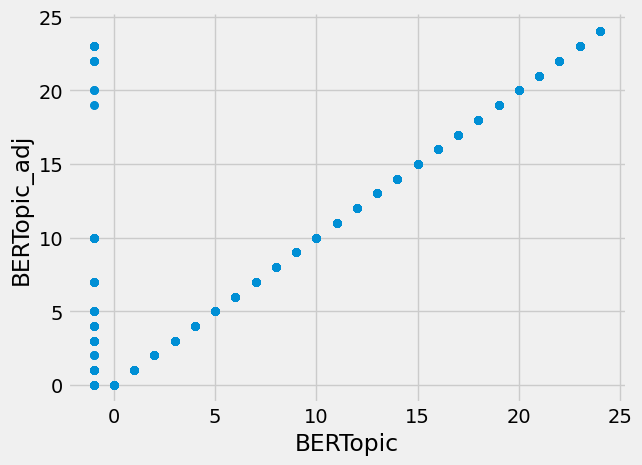

In [28]:
# @title BERTopic vs BERTopic_adj

from matplotlib import pyplot as plt
df_topics_BERTopic_26.plot(kind='scatter', x='BERTopic', y='BERTopic_adj', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

In [32]:
## Probability distribution of a particular document across different topics
topic_model_BERTopic.visualize_distribution(probs[12])

In [34]:
df_topic[df_topic['Argument ID'] == 'A01019']

,Argument ID,Premise,Premise_list,Premise_clean
12,A01019,factory farming cuts too many health and safety corners as opposed to smalle...,"[factori, farm, cut, mani, health, safeti, corner, oppos, smaller, famili, f...",factori farm cut mani health safeti corner oppos smaller famili farm lead po...


In [ ]:
df_topics_BERTopic_26.columns

Index(['Argument ID', 'BERTopic', 'BERTopic_adj'], dtype='object')

In [35]:
## JOIN original premises df with topics from BERTopic model

df_topics_BERT = df_topics_BERTopic_26[['Argument ID','BERTopic_adj']].merge(df_topic, on='Argument ID')
df_topics_BERT[df_topics_BERT['Argument ID'].duplicated()]

,Argument ID,BERTopic_adj,Premise,Premise_list,Premise_clean


In [36]:
df_topics_BERT.head()

,Argument ID,BERTopic_adj,Premise,Premise_list,Premise_clean
0,A01002,14,we should ban human cloning as it will only cause huge issues when you have ...,"[ban, human, clone, caus, huge, issu, bunch, human, run, around, act]",ban human clone caus huge issu bunch human run around act
1,A01005,10,fast food should be banned because it is really bad for your health and is c...,"[fast, food, ban, realli, bad, health, cost]",fast food ban realli bad health cost
2,A01006,0,sometimes economic sanctions are the only thing that will get the corrupt go...,"[sometim, econom, sanction, thing, get, corrupt, govern, take, action]",sometim econom sanction thing get corrupt govern take action
3,A01007,1,capital punishment is sometimes the only option to keep criminals from commi...,"[capit, punish, sometim, option, keep, crimin, commit, crime]",capit punish sometim option keep crimin commit crime
4,A01008,10,"factory farming allows for the production of cheap food, which is a necessit...","[factori, farm, allow, product, cheap, food, necess, famili, surviv, low, in...",factori farm allow product cheap food necess famili surviv low incom


In [37]:
## Apply BERT model to test dataset using the same approach for outliers (topic -1)

test_topics, _ = topic_model_BERTopic.transform(df_topic_test['Premise_clean'])

df_topics_BERTopic_test = pd.DataFrame({'Argument ID': df_topic_test['Argument ID'], 'BERTopic': test_topics})

# Add a new column for adjusted topics
df_topics_BERTopic_test['BERTopic_adj'] = df_topics_BERTopic_test['BERTopic']

# Iterate through the DataFrame and update BERTopic_adj for topics assigned as -1
for i, row in df_topics_BERTopic_test.iterrows():
    if row['BERTopic'] == -1:
        # Find the index of the max value in the corresponding probs array
        max_prob_index = np.argmax(probs[i])
        # Replace the BERTopic_adj value with this index
        df_topics_BERTopic_test.at[i, 'BERTopic_adj'] = max_prob_index

In [38]:
df_topics_BERTopic_test.head()

,Argument ID,BERTopic,BERTopic_adj
0,A26004,0,0
1,A26010,-1,10
2,A26016,4,4
3,A26024,7,7
4,A26026,1,1


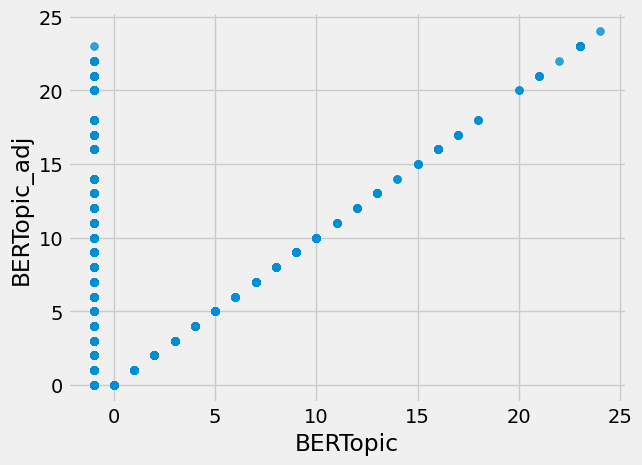

In [39]:
# @title BERTopic vs BERTopic_adj

from matplotlib import pyplot as plt
df_topics_BERTopic_test.plot(kind='scatter', x='BERTopic', y='BERTopic_adj', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

In [40]:
# Check for duplicates
df_topics_BERTopic_test[df_topics_BERTopic_test['Argument ID'].duplicated()].size

0

In [99]:
## JOIN original premises test df with topics from BERTopic model

df_topics_BERT_test = df_topics_BERTopic_test[['Argument ID','BERTopic_adj']].merge(df_topic_test, on='Argument ID')
df_topics_BERT_test[df_topics_BERT_test['Argument ID'].duplicated()]

,Argument ID,BERTopic_adj,Premise,Premise_list,Premise_clean


In [41]:
## Save datasets

df_BERTtopics_info.to_parquet('/content/drive/MyDrive/DSE_fp_files/df_BERTtopics_info.parquet')
top_topics_BERTopic_26.to_parquet('/content/drive/MyDrive/DSE_fp_files/top_topics_BERTopic_26.parquet')
df_topics_BERT.to_parquet('/content/drive/MyDrive/DSE_fp_files/df_topics_BERT_v2.parquet')
df_topics_BERTopic_test.to_parquet('/content/drive/MyDrive/DSE_fp_files/df_topics_BERTopic_test_v2.parquet')
df_topics_BERT_test.to_parquet('/content/drive/MyDrive/DSE_fp_files/df_topics_BERT_test.parquet')

In [5]:
## Read datasets with topics

top_topics_BERTopic_26 = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/top_topics_BERTopic_26.parquet')
df_topics_BERT = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/df_topics_BERT_v2.parquet')
df_topics_BERTopic_test = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/df_topics_BERTopic_test_v2.parquet')
df_BERTtopics_info = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/df_BERTtopics_info.parquet')
df_topics_BERT_test = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/df_topics_BERT_test.parquet')

In [43]:
df_topics_BERT.head()

,Argument ID,BERTopic_adj,Premise,Premise_list,Premise_clean
0,A01002,14,we should ban human cloning as it will only cause huge issues when you have ...,"[ban, human, clone, caus, huge, issu, bunch, human, run, around, act]",ban human clone caus huge issu bunch human run around act
1,A01005,10,fast food should be banned because it is really bad for your health and is c...,"[fast, food, ban, realli, bad, health, cost]",fast food ban realli bad health cost
2,A01006,0,sometimes economic sanctions are the only thing that will get the corrupt go...,"[sometim, econom, sanction, thing, get, corrupt, govern, take, action]",sometim econom sanction thing get corrupt govern take action
3,A01007,1,capital punishment is sometimes the only option to keep criminals from commi...,"[capit, punish, sometim, option, keep, crimin, commit, crime]",capit punish sometim option keep crimin commit crime
4,A01008,10,"factory farming allows for the production of cheap food, which is a necessit...","[factori, farm, allow, product, cheap, food, necess, famili, surviv, low, in...",factori farm allow product cheap food necess famili surviv low incom


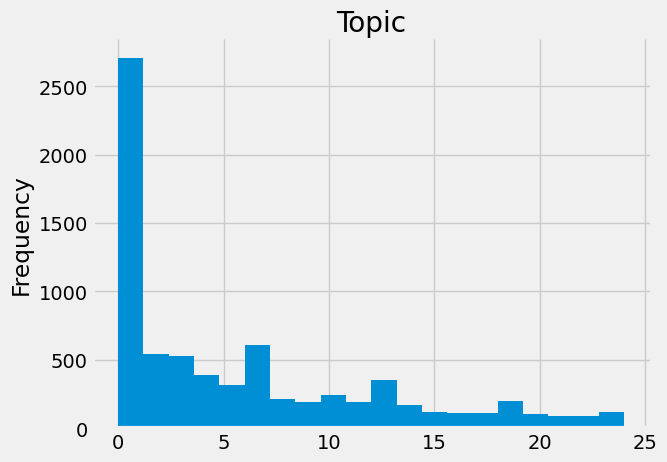

In [44]:
# @title Topic

from matplotlib import pyplot as plt
df_topics_BERT['BERTopic_adj'].plot(kind='hist', bins=20, title='Topic')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [48]:
df_topics_BERT.groupby('BERTopic_adj')['Argument ID'].count()/df_topics_BERT['Argument ID'].count()

BERTopic_adj
0     0.252267
1     0.114089
2     0.073352
3     0.071052
4     0.052916
5     0.042225
6     0.040466
7     0.041819
8     0.028421
9     0.025985
10    0.033022
11    0.025579
12    0.024361
13    0.023549
14    0.022737
15    0.016240
16    0.015293
17    0.015158
18    0.013534
19    0.013804
20    0.013669
21    0.012451
22    0.012316
23    0.012857
24    0.002842
Name: Argument ID, dtype: float64

In [47]:
df_topics_BERT.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7389 entries, 0 to 7388
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Argument ID    7389 non-null   object
 1   BERTopic_adj   7389 non-null   int64 
 2   Premise        7389 non-null   object
 3   Premise_list   7389 non-null   object
 4   Premise_clean  7389 non-null   object
dtypes: int64(1), object(4)
memory usage: 288.8+ KB


##### Human values and Topics embedding
Next, we are going to represent each Human value and Topic as embeddings using pre-trained RoBERTa model, ensuring that their representations capture the semantic meaning of the values so that they can be compared to the topics effectively.

In [49]:
pip install transformers

In [54]:
from transformers import RobertaTokenizer, RobertaModel
import torch

# Load RoBERTa pre-trained model and tokenizer
tokenizer = RobertaTokenizer.from_pretrained("roberta-base")
model = RobertaModel.from_pretrained("roberta-base")

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [50]:
df_BERTtopics_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7389 entries, 0 to 7388
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Document                 7389 non-null   object 
 1   Topic                    7389 non-null   int64  
 2   Name                     7389 non-null   object 
 3   Representation           7389 non-null   object 
 4   Representative_Docs      7389 non-null   object 
 5   Top_n_words              7389 non-null   object 
 6   Probability              7389 non-null   float64
 7   Representative_document  7389 non-null   bool   
dtypes: bool(1), float64(1), int64(1), object(5)
memory usage: 411.4+ KB


In [51]:
df_topics_BERT.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7389 entries, 0 to 7388
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Argument ID    7389 non-null   object
 1   BERTopic_adj   7389 non-null   int64 
 2   Premise        7389 non-null   object
 3   Premise_list   7389 non-null   object
 4   Premise_clean  7389 non-null   object
dtypes: int64(1), object(4)
memory usage: 288.8+ KB


In [52]:
topic_df = df_BERTtopics_info[['Topic','Top_n_words']].query("Topic!=-1").sort_values(by='Topic')
topic_df = topic_df.drop_duplicates(subset='Topic').reset_index(drop=True)

topic_df

,Topic,Top_n_words
0,0,eu - work - militari - econom - sanction - privat - auster - execut - intell...
1,1,crime - crimin - three - strike - prostitut - cannabi - activ - would - judg...
2,2,child - foster - homeschool - care - polici - cloth - famili - environ - all...
3,3,surrogaci - parad - vow - select - famili - peopl - priest - abandon - gende...
4,4,surgeri - cosmet - medium - homeopathi - medicin - connect - ban - esteem - ...
5,5,church - atheism - scientolog - school - religi - pray - peopl - everyon - a...
6,6,libertarian - system - would - voter - adopt - peopl - choic - voic - societ...
7,7,nuclear - bear - abolish - war - terrorist - protect - countri - shoot - det...
8,8,whale - zoo - anim - speci - extinct - endang - abolish - protect - conserv ...
9,9,earth - subsid - abolish - peopl - fear - cost - import - benefit - speech -...


In [55]:
## Compute RoBERTa topic embeddings

# Initialize a dictionary to store topic embeddings
topic_embeddings = {}

for index, row in topic_df.iterrows():
    topic = str(row["Topic"])  # convert topic number to string
    description = row["Top_n_words"]

    # Tokenize and encode the description using RoBERTa
    input_ids = tokenizer.encode(description, add_special_tokens=True)
    input_ids = torch.tensor(input_ids).unsqueeze(0)  # Batch size of 1

    # Get the RoBERTa embeddings for the description
    with torch.no_grad():
        embeddings = model(input_ids)[0]

    # Average the embeddings across tokens
    topic_embedding = torch.mean(embeddings, dim=1).squeeze().numpy()

    # Store the embedding for the topic in the topic_embeddings dictionary
    topic_embeddings[topic] = topic_embedding

In [56]:
len(topic_embeddings)     # check that we have 25 topics (26 less the outlier)

25

In [57]:
## Import Human values description dataset

import json

with open('/content/drive/MyDrive/DSE_fp_files/value-categories.json') as json_data:
    df_values = json.load(json_data)

## Create a list of the 20 Human values formed by its category and all the descriptions

human_values_combined = []

for value_category, values_dict in df_values.items():
    # Create an empty list to store all descriptions for this category
    category_descriptions = []

    for value_name, descriptions in values_dict.items():
        # Append the descriptions for this value to the category_descriptions list
        category_descriptions.extend(descriptions)

    # Create a dictionary entry for the entire category with combined descriptions
    value_data = {
        "value": value_category,
        "description": category_descriptions
    }
    human_values_combined.append(value_data)

In [58]:
len(human_values_combined)      # check that we have 20 Human values

20

In [59]:
human_values_combined[0:1]      # example

[{'value': 'Self-direction: thought',
  'description': ['allowing for more creativity or imagination',
   'being more creative',
   'fostering creativity',
   'promoting imagination',
   'being the more interesting option',
   'fostering curiosity',
   'making people more keen to learn',
   'promoting discoveries',
   'sparking interest',
   'allowing people to figure things out on their own',
   'allowing people to make up their mind',
   'resulting in less censorship',
   "resulting in less influence on people's thoughts"]}]

In [60]:
## Compute RoBERTa embeddings for each Human value

tokenizer = RobertaTokenizer.from_pretrained('roberta-base')
model = RobertaModel.from_pretrained('roberta-base')

value_embeddings = {}

for value_info in human_values_combined:
    value = value_info["value"]
    description = value_info["description"]

    # Tokenize and encode the description using RoBERTa
    input_ids = tokenizer.encode(description, add_special_tokens=True)
    input_ids = torch.tensor(input_ids).unsqueeze(0)  # Batch size of 1

    # Get the RoBERTa embeddings for the description
    with torch.no_grad():
        embeddings = model(input_ids)[0]

    # Average the embeddings across tokens
    value_embedding = torch.mean(embeddings, dim=1).squeeze().numpy()

    # Store the embedding for the value
    value_embeddings[value] = value_embedding

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [65]:
## Now we are gonna compute Cosine similarity between each topic and each Human value

# Create empty matrices to store Similarity scores
num_human_values = len(value_embeddings)
num_topics = len(topic_embeddings)
similarity_matrix = np.zeros((num_topics, num_human_values))

# Calculate cosine similarity for each topic and human value pair
for i, (topic, topic_embedding) in enumerate(topic_embeddings.items()):
    for j, (human_value, human_value_embedding) in enumerate(value_embeddings.items()):
        # Calculate cosine similarity between topic and human value embeddings
        similarity_score = cosine_similarity([topic_embedding], [human_value_embedding])[0][0]
        similarity_matrix[i][j] = similarity_score

In [62]:
## Now we analyze the results

# Create a DataFrame for better visualization

topics = list(topic_df['Topic'])
human_values = list(df_values.keys())

similarity_df = pd.DataFrame(similarity_matrix, index=topics, columns=human_values)

# Aggregate by computing the mean similarity score for each topic
topic_avg_similarity = similarity_df.mean(axis=1)

# Print aggregated similarity scores for each topic
print("Aggregate Similarity Scores:")
print(topic_avg_similarity)

Aggregate Similarity Scores:
0     0.880780
1     0.873799
2     0.889895
3     0.890058
4     0.888121
5     0.889178
6     0.880846
7     0.881593
8     0.888653
9     0.887093
10    0.885997
11    0.890319
12    0.895702
13    0.880298
14    0.885031
15    0.887847
16    0.879432
17    0.886028
18    0.870424
19    0.893568
20    0.896588
21    0.881986
22    0.881558
23    0.883020
24    0.873560
dtype: float64


In [135]:
# Find the topic with the highest similarity for each human value
highest_similarity_indexes = similarity_df.idxmax()

# Transpose the DataFrame
highest_similarity_df = highest_similarity_indexes.to_frame()
highest_similarity_df

,0
Self-direction: thought,19
Self-direction: action,20
Stimulation,20
Hedonism,12
Achievement,2
Power: dominance,12
Power: resources,12
Face,12
Security: personal,2
Security: societal,12


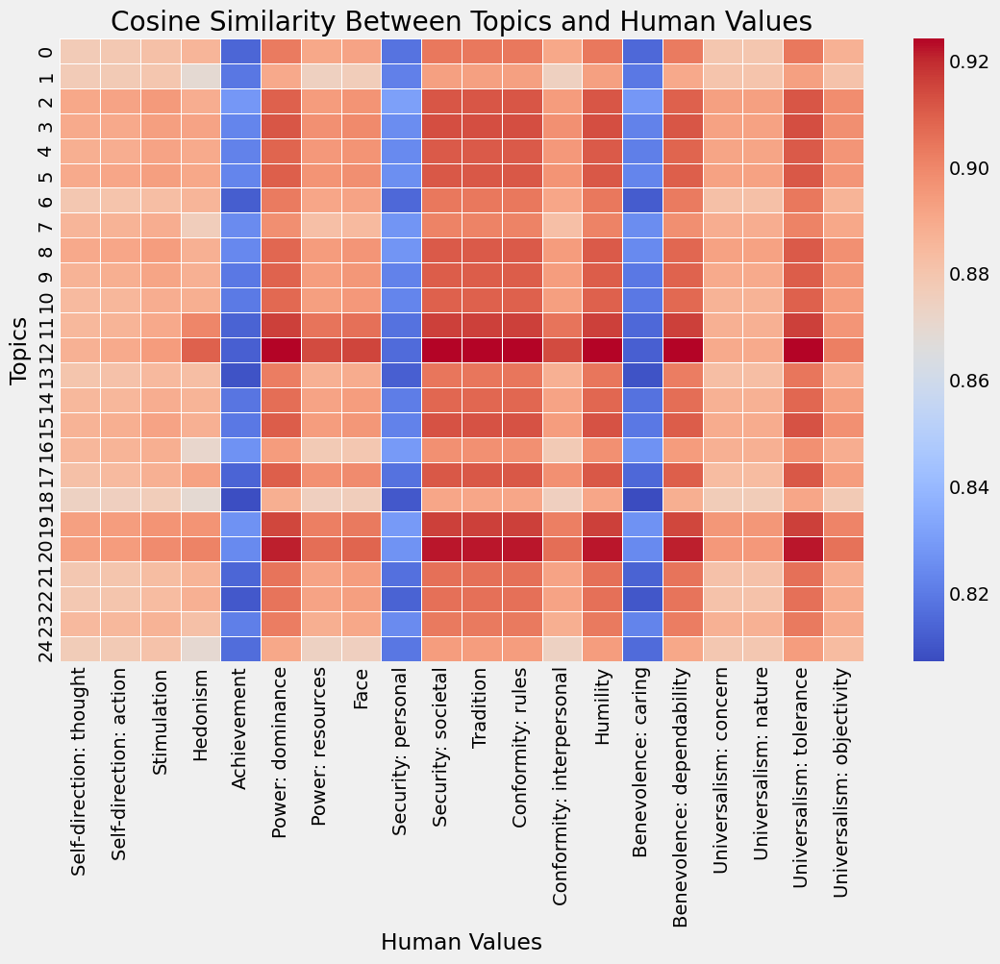

In [63]:
## Plot a heatmap to visualize the results

plt.figure(figsize=(12, 8))
sns.heatmap(similarity_df.sort_index(), annot=False, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Cosine Similarity Between Topics and Human Values")
plt.xlabel("Human Values")
plt.ylabel("Topics")
plt.show()

In [66]:
## Results for a specific example

selected_value = "Universalism: nature"

# Find top 10 topics most similar to the selected human value
most_similar_topics = similarity_df[selected_value].sort_values(ascending=False).head(10).index

# Display examples of topics that are highly similar to the selected human value
print(f"Examples of topics highly similar to '{selected_value}':")
for i, topic in enumerate(most_similar_topics):
    topic_description = topic_df.loc[topic_df["Topic"] == topic, "Top_n_words"].values[0]
    print(f"{i + 1}. {topic}: {topic_description}")

Examples of topics highly similar to 'Universalism: nature':
1. 19: blockad - gaza - strip - peac - rocket - area - harm - humanitarian - necessari - citizen
2. 20: algorithm - monopoli - trader - advantag - ban - technolog - crash - economi - manipul - enabl
3. 2: child - foster - homeschool - care - polici - cloth - famili - environ - allow - social
4. 8: whale - zoo - anim - speci - extinct - endang - abolish - protect - conserv - import
5. 3: surrogaci - parad - vow - select - famili - peopl - priest - abandon - gender - ban
6. 5: church - atheism - scientolog - school - religi - pray - peopl - everyon - allow - differ
7. 4: surgeri - cosmet - medium - homeopathi - medicin - connect - ban - esteem - mani - danger
8. 12: wikipedia - inform - sourc - journalist - bias - subsidi - govern - pay - articl - could
9. 9: earth - subsid - abolish - peopl - fear - cost - import - benefit - speech - safeti
10. 15: iq - exam - harm - low - bring - neet - peopl - base - focus - child


 Matrix values values are high, indicating that probably cosine similarity metric may not be effectively discriminating between topics in relation to human values. Therefore, we are gonna normalize the cosine similarity scores to a range between 0 and 1, to emphasize the differences in similarity, by using min-max scaling.

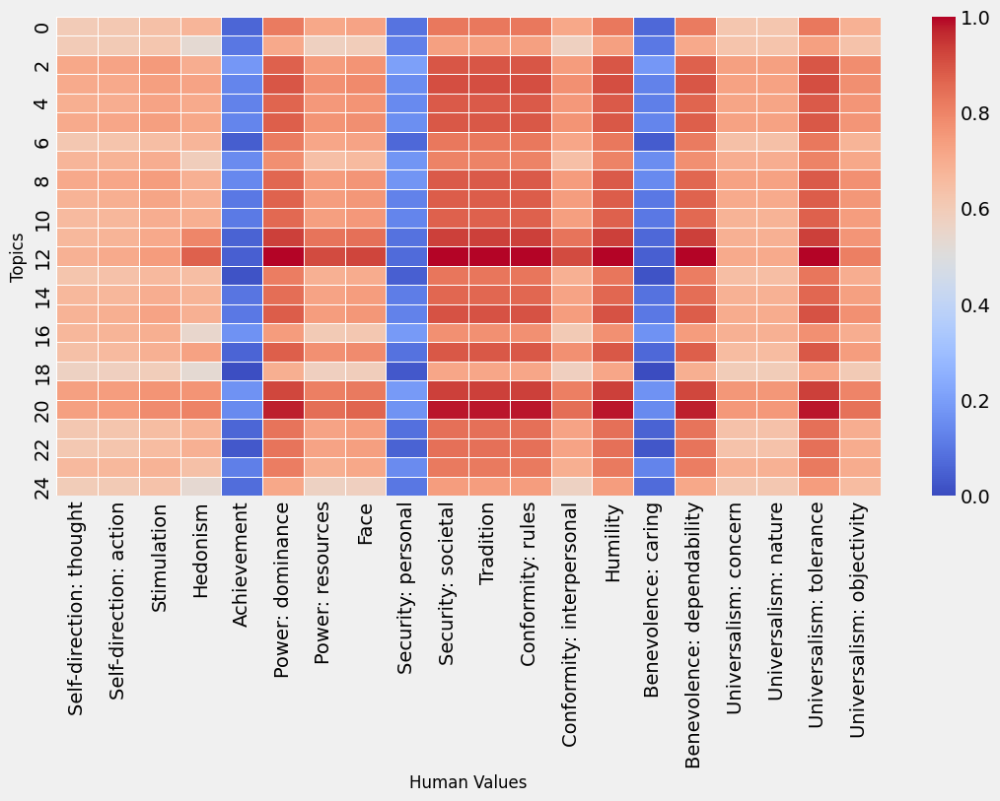

In [73]:
# Min-max scaling

min_score = np.min(similarity_df)
max_score = np.max(similarity_df)
scaled_scores = (similarity_df - min_score) / (max_score - min_score)

## Plot a heatmap to visualize the scaled results

plt.figure(figsize=(12, 6))
sns.heatmap(scaled_scores, annot=False, cmap="coolwarm", fmt=".2f", linewidths=0.5)
#plt.title("Scaled Cosine Similarity Between Topics and Human Values")
plt.xlabel("Human Values", fontsize=12)
plt.ylabel("Topics", fontsize=12)
plt.show()

In [ ]:
topic_df[(topic_df["Topic"]==20)]

,Topic,Top_n_words
20,20,algorithm - comput - trader - ban - advantag - crash - economi - easier - en...


In [76]:
topic_df[(topic_df["Topic"]==17) | (topic_df["Topic"]==24)]

,Topic,Top_n_words
17,17,autonom - develop - caus - traffic - futur - error - disabl - react - safer ...
24,24,crime - soro - ngo - lukashenka - stabil - advantag - first - georg - belaru...


In [80]:
## Results for a specific example

selected_value = "Universalism: nature"

# Find top topics most similar to the selected human value (selected_value > 0.7)
most_similar_topics = scaled_scores[scaled_scores[selected_value]>0.7][selected_value].sort_values(ascending=False).head(10).index

# Display examples of topics that are highly similar to the selected human value
print(f"Examples of topics highly similar to '{selected_value}':")
for i, topic in enumerate(most_similar_topics):
    topic_description = topic_df.loc[topic_df["Topic"] == topic, "Top_n_words"].values[0]
    print(f"{i + 1}. {topic}: {topic_description}")

Examples of topics highly similar to 'Universalism: nature':
1. 19: blockad - gaza - strip - peac - rocket - area - harm - humanitarian - necessari - citizen
2. 20: algorithm - monopoli - trader - advantag - ban - technolog - crash - economi - manipul - enabl
3. 2: child - foster - homeschool - care - polici - cloth - famili - environ - allow - social
4. 8: whale - zoo - anim - speci - extinct - endang - abolish - protect - conserv - import
5. 3: surrogaci - parad - vow - select - famili - peopl - priest - abandon - gender - ban
6. 5: church - atheism - scientolog - school - religi - pray - peopl - everyon - allow - differ
7. 4: surgeri - cosmet - medium - homeopathi - medicin - connect - ban - esteem - mani - danger
8. 12: wikipedia - inform - sourc - journalist - bias - subsidi - govern - pay - articl - could
9. 9: earth - subsid - abolish - peopl - fear - cost - import - benefit - speech - safeti
10. 15: iq - exam - harm - low - bring - neet - peopl - base - focus - child


In [81]:
## Find the description of the Human value selected above

selected_value_info = None
for value_info in human_values_combined:
    if value_info['value'] == selected_value:
        selected_value_info = value_info
        break

if selected_value_info:
    # Access the description associated with the value
    value_description = selected_value_info['description']

    # Print the description
    for i, desc in enumerate(value_description, 1):
        print(f"{i}. {desc}")

1. avoiding pollution
2. fostering to care for nature
3. promoting programs to restore nature
4. resulting in less damage to the ecosystem
5. allowing to avoid chemicals (especially in nutrition)
6. allowing to avoid genetically modified organisms
7. fostering to treat animals or plants like them having souls
8. promoting a life in harmony with nature
9. resulting in more people reflecting the consequences of their actions towards the environment
10. allowing people to experience art
11. fostering to stand in awe of nature
12. promoting fine arts
13. promoting the beauty of nature
14. spreading beauty


In [83]:
## Perform one-way ANOVA test for all topics and Human values

f_statistic, p_value = f_oneway(*similarity_df.values.T)

alpha = 0.05

# Print ANOVA results
if p_value<alpha:
    print("\nANOVA: There is a significant difference in correlation scores for topics and Human values.")
else:
    print("\nANOVA: No significant difference in correlation scores.")


ANOVA: There is a significant difference in correlation scores for topics and Human values.


In [84]:
## Perform pairwise t-tests to compare each topic or human value individually

alpha = 0.05

# Initialize lists to store significant and non significant topics and human values
significant_results = []
non_significant_results = []

# Iterate through topics and perform pairwise t-tests
for topic in similarity_df.index:
    for human_value in similarity_df.columns:
        group1 = similarity_df.loc[topic].values
        group2 = similarity_df[human_value].values
        t_stat, p_value = ttest_ind(group1, group2)

        if p_value < alpha:
            significant_results.append((topic, human_value, p_value))
        else:
          non_significant_results.append((topic, human_value, p_value))

# Store the results
result_df = pd.DataFrame(significant_results, columns=['Topic', 'Human Value', 'P-Value'])
non_sig_result_df = pd.DataFrame(non_significant_results, columns=['Topic', 'Human Value', 'P-Value'])

# Print the significant results
print("Significant Results:")
print(result_df)

Significant Results:
     Topic                 Human Value       P-Value
0        0                 Achievement  4.191080e-13
1        0            Power: dominance  2.446593e-04
2        0          Security: personal  1.839925e-12
3        0          Security: societal  9.108140e-05
4        0                   Tradition  9.108140e-05
..     ...                         ...           ...
265     24  Benevolence: dependability  5.728263e-07
266     24       Universalism: concern  1.501292e-02
267     24        Universalism: nature  1.501292e-02
268     24     Universalism: tolerance  1.584426e-07
269     24   Universalism: objectivity  9.294159e-04

[270 rows x 3 columns]


In [85]:
print(result_df['Topic'].unique())
print(result_df['Topic'].nunique())

## At least there is a significat correlation with a Human value for each of the 25 topics

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24]
25


In [86]:
print(result_df['Human Value'].unique())
print(result_df['Human Value'].nunique())

## For all human values there is a significant correlation with a topic

['Achievement' 'Power: dominance' 'Security: personal'
 'Security: societal' 'Tradition' 'Conformity: rules' 'Humility'
 'Benevolence: caring' 'Benevolence: dependability'
 'Universalism: tolerance' 'Self-direction: thought'
 'Self-direction: action' 'Stimulation' 'Hedonism' 'Power: resources'
 'Face' 'Conformity: interpersonal' 'Universalism: concern'
 'Universalism: nature' 'Universalism: objectivity']
20


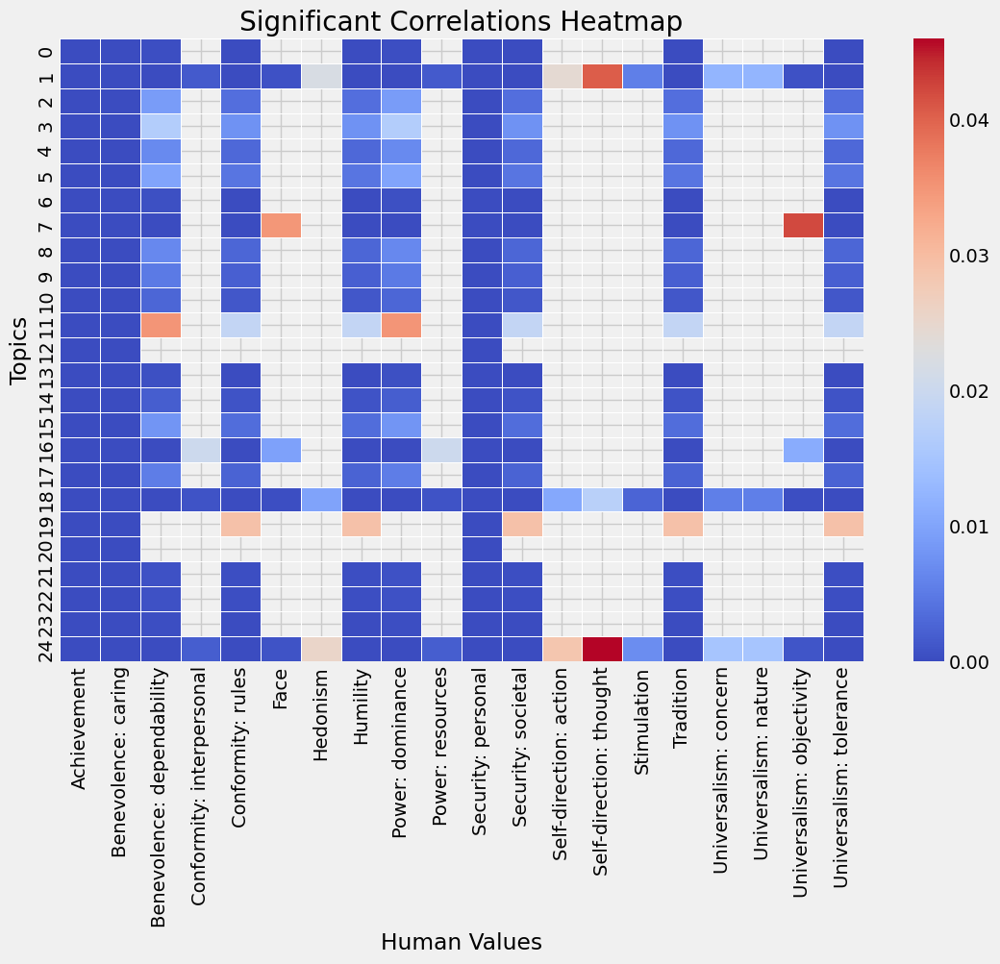

In [87]:
## Correlation matrix
correlation_matrix = result_df.pivot(index='Topic', columns='Human Value', values='P-Value')

# Create a heatmap with significant correlations highlighted
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', cbar=True, linewidths=0.5)
plt.title("Significant Correlations Heatmap")
plt.xlabel("Human Values")
plt.ylabel("Topics")
plt.show()

### 3. Random Forest classifier

In this stage, we fit a Multi-label classification model for predicting Human values for each argument, with a Random Forest algorithm, using as features the combination of the arguments (embeddings), topics (embeddings), and correlation scores between topics and human values (obtained in point 2).

#### 3.1 All the features (arguments, topics, and correlation topics <> human values)

In [88]:
## Firstly, we need to compute arguments embeddings with RoBERTa

import torch
from transformers import RobertaTokenizer, RobertaModel

# Initialize the tokenizer and model for RoBERTa
tokenizer = RobertaTokenizer.from_pretrained('roberta-base')
model = RobertaModel.from_pretrained('roberta-base')

# Initialize a dictionary to store argument embeddings
argument_embeddings = {}

# Initialize a dictionary to store the token to embedding mappings for each argument
token_to_embedding_map = {}

for index, row in df_topic.iterrows():
    argument_id = row["Argument ID"]
    description = row["Premise_clean"]

    # Tokenize and encode the description using RoBERTa
    input_ids = tokenizer.encode(description, add_special_tokens=True)
    input_ids_tensor = torch.tensor([input_ids])  # Corrected for batch size of 1

    # Decode the input_ids to get the original tokens
    tokens = tokenizer.convert_ids_to_tokens(input_ids)

    # Get the RoBERTa embeddings for the argument
    with torch.no_grad():
        outputs = model(input_ids_tensor)
        embeddings = outputs.last_hidden_state.squeeze(0)  # Remove batch dimension

    # Map each token to its corresponding embedding
    token_embeddings = {token: embedding for token, embedding in zip(tokens, embeddings)}

    # Store the token to embedding map for the argument_id
    token_to_embedding_map[argument_id] = token_embeddings

    # Calculate the average of the embeddings across tokens to get the argument embedding
    argument_embedding = torch.mean(embeddings, dim=0).numpy()
    argument_embeddings[argument_id] = argument_embedding

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# Convert the argument_embeddings dictionary to a DataFrame
argument_embeddings_df = pd.DataFrame.from_dict(argument_embeddings, orient='index').rename(columns=lambda x: str(x) + '_x')
argument_embeddings_df['Argument ID'] = argument_embeddings_df.index

argument_embeddings_df.to_parquet('/content/drive/MyDrive/DSE_fp_files/argument_embeddings.parquet')

In [ ]:
argument_embeddings_df = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/argument_embeddings.parquet')
argument_embeddings_df.head()

,0_x,1_x,2_x,3_x,4_x,5_x,6_x,7_x,8_x,9_x,...,759_x,760_x,761_x,762_x,763_x,764_x,765_x,766_x,767_x,Argument ID
A01002,-0.079261,-0.013017,0.004095,-0.055207,0.240999,-0.048076,0.042455,0.079638,0.101069,-0.021531,...,0.074527,-0.129490,-0.058074,-0.169672,0.046766,0.276380,-0.099719,-0.269657,-0.015069,A01002
A01005,-0.041448,0.042096,-0.070189,-0.006378,0.429465,0.051760,-0.023908,-0.031731,-0.048253,0.015842,...,-0.114248,-0.139629,-0.124216,-0.009662,0.049719,0.234976,-0.067432,-0.023856,0.046241,A01005
A01006,0.026711,-0.088396,0.025188,0.035055,0.026550,-0.189176,-0.002872,-0.029660,0.082231,-0.071629,...,-0.069005,-0.112969,0.017023,-0.077612,-0.017053,0.227139,0.082506,0.030237,0.051201,A01006
A01007,0.036777,0.047810,-0.033085,0.024360,0.147896,-0.067350,0.020082,-0.108549,0.148876,-0.090541,...,-0.057775,-0.084844,-0.050322,-0.144564,-0.131796,0.287855,0.067299,-0.067302,0.059412,A01007
A01008,-0.015431,0.017548,0.047067,-0.021944,0.091939,0.040952,0.058898,-0.008141,0.039062,-0.048508,...,-0.053917,-0.043859,-0.081094,-0.007009,-0.037576,0.076206,-0.128420,-0.076679,0.030744,A01008


In [ ]:
## Concatenate Correlation scores to BERT topic embeddings

# Convert the topic_embeddings dictionary to a DataFrame
topic_embeddings_df = pd.DataFrame.from_dict(topic_embeddings, orient='index')

# Reset the index for both DataFrames
topic_embeddings_df.reset_index(drop=True, inplace=True)
similarity_df.reset_index(drop=True, inplace=True)

# Combine topic_embeddings_df and similarity_df
BERT_combined_df = pd.concat([topic_embeddings_df, similarity_df], axis=1)
BERT_combined_df.reset_index(drop=False, inplace=True)

BERT_combined_df.head()

In [ ]:
## Check for nulls
BERT_combined_df[BERT_combined_df.isnull().any(axis=1)]

,index,0,1,2,3,4,5,6,7,8,...,Tradition,Conformity: rules,Conformity: interpersonal,Humility,Benevolence: caring,Benevolence: dependability,Universalism: concern,Universalism: nature,Universalism: tolerance,Universalism: objectivity


In [ ]:
## Save the dataset

BERT_combined_df_string = BERT_combined_df.copy()
BERT_combined_df_string.columns = BERT_combined_df.columns.astype(str)
BERT_combined_df_string.to_parquet('/content/drive/MyDrive/DSE_fp_files/BERT_combined_df.parquet')

In [ ]:
BERT_combined_df = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/BERT_combined_df.parquet')

In [ ]:
dimensions = BERT_combined_df.shape # topic_embeddings and similarity_df

# Display the dimensions
print(f"Number of rows: {dimensions[0]}")
print(f"Number of columns: {dimensions[1]}")

Number of rows: 25
Number of columns: 789


In [ ]:
BERT_combined_df.columns

Index(['index', '0', '1', '2', '3', '4', '5', '6', '7', '8',
       ...
       'Tradition', 'Conformity: rules', 'Conformity: interpersonal',
       'Humility', 'Benevolence: caring', 'Benevolence: dependability',
       'Universalism: concern', 'Universalism: nature',
       'Universalism: tolerance', 'Universalism: objectivity'],
      dtype='object', length=789)

In [ ]:
## Final step: create our features matrix X by combining argument embeddings, topic embeddings, and correlation scores

# Convert the argument_embeddings dictionary to a DataFrame
argument_embeddings_df = pd.DataFrame.from_dict(argument_embeddings, orient='index')

# Merge argument_embeddings_df based on the outcome of the topic modeling
merge = argument_embeddings_df.merge(df_topics_BERT[['Argument ID','BERTopic_adj']].set_index('Argument ID'),
                                                     left_index=True, right_index=True)

# Rename columns of merge DataFrame to add '_x' suffix
merge_renamed = merge.rename(columns=lambda x: str(x) + '_x')
BERT_combined_df_renamed = BERT_combined_df.rename(columns=lambda x: str(x) + '_top')

# Combine argument embeddings with topic embeddings, and correlation scores (topics <> human values)
X = pd.merge(merge_renamed, BERT_combined_df_renamed, left_on='BERTopic_adj_x', right_on='index_top', how='left')
X.drop(columns=['BERTopic_adj_x'], inplace=True)

# Display the last few rows
X.tail()

,0_x,1_x,2_x,3_x,4_x,5_x,6_x,7_x,8_x,9_x,...,Tradition_top,Conformity: rules_top,Conformity: interpersonal_top,Humility_top,Benevolence: caring_top,Benevolence: dependability_top,Universalism: concern_top,Universalism: nature_top,Universalism: tolerance_top,Universalism: objectivity_top
7384,-0.047278,-0.055469,0.004098,0.016220,-0.136561,-0.467804,0.089007,0.006920,-0.091154,-0.076668,...,0.900149,0.900149,0.883727,0.900149,0.81863,0.898612,0.881456,0.881456,0.900149,0.886445
7385,-0.008735,-0.019172,0.021912,0.095027,-0.092780,-0.342195,0.014887,-0.080945,-0.105717,-0.048757,...,0.900149,0.900149,0.883727,0.900149,0.81863,0.898612,0.881456,0.881456,0.900149,0.886445
7386,-0.007149,0.074322,-0.022328,-0.002108,-0.279672,-0.394078,0.001321,-0.011003,-0.026103,-0.027478,...,0.900149,0.900149,0.883727,0.900149,0.81863,0.898612,0.881456,0.881456,0.900149,0.886445
7387,-0.038698,0.027405,-0.000759,0.074365,-0.124750,-0.140761,0.053218,0.048031,-0.016893,-0.011176,...,0.900149,0.900149,0.883727,0.900149,0.81863,0.898612,0.881456,0.881456,0.900149,0.886445
7388,-0.028601,-0.099854,-0.015417,0.056189,-0.157844,-0.316118,0.105892,-0.073661,-0.086306,-0.046001,...,0.900149,0.900149,0.883727,0.900149,0.81863,0.898612,0.881456,0.881456,0.900149,0.886445


In [ ]:
dimensions = X.shape

# Display the dimensions
print(f"Number of rows: {dimensions[0]}")
print(f"Number of columns: {dimensions[1]}")

Number of rows: 7389
Number of columns: 1556


In [ ]:
# Number of rows with null values
X[X.isnull().any(axis=1)]

,0_x,1_x,2_x,3_x,4_x,5_x,6_x,7_x,8_x,9_x,...,Tradition,Conformity: rules,Conformity: interpersonal,Humility,Benevolence: caring,Benevolence: dependability,Universalism: concern,Universalism: nature,Universalism: tolerance,Universalism: objectivity


In [ ]:
# Save dataset
X_string = X.copy()
X_string.columns = X_string.columns.astype(str)
X_string.to_parquet('/content/drive/MyDrive/DSE_fp_files/X_dataset_BERT.parquet')

In [3]:
X = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/X_dataset_BERT.parquet')

In [ ]:
df_topics_BERT.head()

,Argument ID,BERTopic_adj,Premise,Premise_list,Premise_clean
0,A01002,13,we should ban human cloning as it will only cause huge issues when you have ...,"[ban, human, clone, caus, huge, issu, bunch, human, run, around, act]",ban human clone caus huge issu bunch human run around act
1,A01005,6,fast food should be banned because it is really bad for your health and is c...,"[fast, food, ban, realli, bad, health, cost]",fast food ban realli bad health cost
2,A01006,0,sometimes economic sanctions are the only thing that will get the corrupt go...,"[sometim, econom, sanction, thing, get, corrupt, govern, take, action]",sometim econom sanction thing get corrupt govern take action
3,A01007,1,capital punishment is sometimes the only option to keep criminals from commi...,"[capit, punish, sometim, option, keep, crimin, commit, crime]",capit punish sometim option keep crimin commit crime
4,A01008,6,"factory farming allows for the production of cheap food, which is a necessit...","[factori, farm, allow, product, cheap, food, necess, famili, surviv, low, in...",factori farm allow product cheap food necess famili surviv low incom


In [ ]:
## Read labels dataset with human values (binary variables)

y = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/y_dataset_BERT.parquet')
y.head()

,Self-direction: thought,Self-direction: action,Stimulation,Hedonism,Achievement,Power: dominance,Power: resources,Face,Security: personal,Security: societal,Tradition,Conformity: rules,Conformity: interpersonal,Humility,Benevolence: caring,Benevolence: dependability,Universalism: concern,Universalism: nature,Universalism: tolerance,Universalism: objectivity
0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0


In [ ]:
## Fit RF classifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=14)

rf_clf = RandomForestClassifier(n_estimators=100, random_state=14)
rf_clf.fit(X_train, y_train)

RandomForestClassifier(random_state=14)

In [ ]:
### DOES NOT WORK

# Suppress warnings
warnings.filterwarnings("ignore", category=UserWarning)

# Assuming you have a trained RandomForestClassifier called rf_clf

classes = y.columns
all_feat = X.columns

# Define the prediction function
predict_fn_rf = lambda x: rf_clf.predict_proba(x)

# Define a wrapper function to convert predictions into a numpy array
def predict_wrapper(X):
    predictions = np.array([predict_fn_rf(x.reshape(1, -1))[0] for x in X])
    # Remove the unnecessary middle dimension
    predictions = predictions.squeeze(axis=1)
    print("Shape of predictions:", predictions.shape)  # Print the shape of predictions
    return predictions

# Ensure feature names are provided
explainer = LimeTabularExplainer(X_train.values,
                                 mode='classification',
                                 feature_selection='auto',
                                 class_names=classes,
                                 feature_names=all_feat)

observation_1 = 47
exp = explainer.explain_instance(X_test.iloc[observation_1].values,
                                  predict_wrapper,
                                  num_features=20,
                                  top_labels=10)
exp.show_in_notebook()

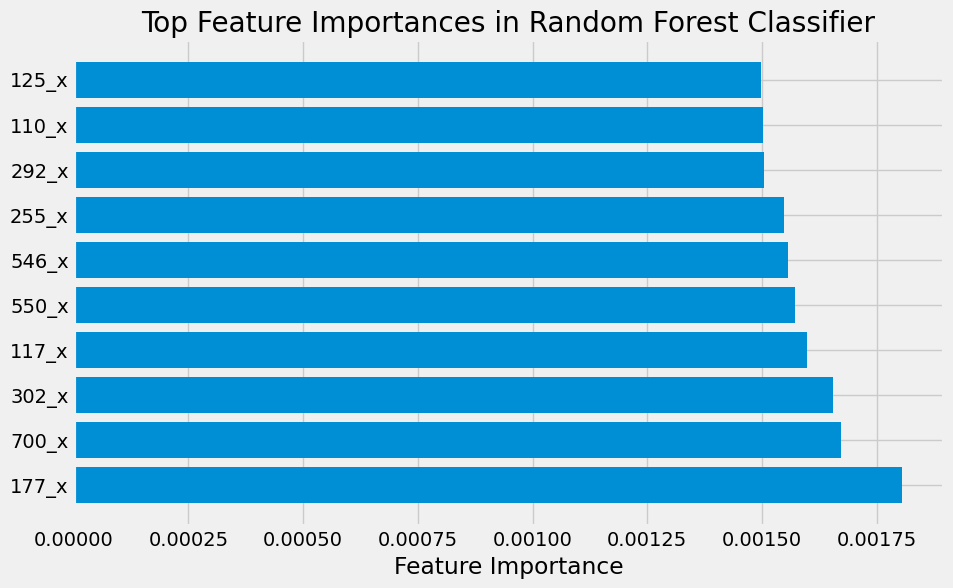

In [ ]:
# Get feature importances
feature_importances = rf_clf.feature_importances_

# Get the indices of the features sorted by importance
sorted_indices = feature_importances.argsort()[::-1]

# Get the top N feature names and importances
top_n = 10
feature_names = X.columns
top_feature_names = [feature_names[i] for i in sorted_indices[:top_n]]
top_feature_importances = feature_importances[sorted_indices[:top_n]]

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(range(top_n), top_feature_importances, align='center')
plt.yticks(range(top_n), top_feature_names)
plt.xlabel('Feature Importance')
plt.title('Top Feature Importances in Random Forest Classifier')
plt.show()

In [ ]:
## Predict on test set and evaluate the model

y_pred = rf_clf.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.57      0.23      0.33       254
           1       0.66      0.17      0.28       374
           2       0.00      0.00      0.00        80
           3       0.00      0.00      0.00        53
           4       0.70      0.24      0.35       438
           5       0.45      0.03      0.06       156
           6       0.53      0.14      0.22       145
           7       0.67      0.02      0.04       105
           8       0.73      0.43      0.54       558
           9       0.75      0.36      0.49       462
          10       0.69      0.26      0.38       167
          11       0.50      0.04      0.08       338
          12       1.00      0.04      0.08        46
          13       0.67      0.02      0.03       125
          14       0.71      0.12      0.20       388
          15       0.25      0.01      0.02       217
          16       0.72      0.37      0.49       554
          17       0.76    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from lime.lime_tabular import LimeTabularExplainer
import warnings

# Suppress warnings
warnings.filterwarnings("ignore", category=UserWarning)

# Define feature names and class names
feature_names = X_train.columns.astype(str)
#class_names = y_train.columns.astype(str)
#feature_names = [f'feature_{i}' for i in range(X_train.shape[1])]
class_names = np.unique(y_train).astype(str)

# Define the predict function for LIME
def predict_proba_fn(X):
    return rf_clf.predict_proba(X)

# Create the LimeTabularExplainer
explainer = LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=feature_names,
    class_names=class_names,
    mode='classification',
)

# Choose an instance to explain
instance_index = 10
data_row = X_test.iloc[[instance_index]].values

# Define a wrapper function to convert predictions into a numpy array
def predict_wrapper(X):
    predictions = np.array([predict_proba_fn(x.reshape(1, -1))[0] for x in X])
    # Remove the unnecessary middle dimension
    predictions = predictions.squeeze(axis=1)
    print("Shape of predictions:", predictions.shape)  # Print the shape of predictions
    return predictions

# Explain the instance
exp = explainer.explain_instance(
    data_row=data_row[0],
    predict_fn=predict_wrapper,  # Use the wrapper function
    num_features=10,  # You can specify the number of features to include in the explanation
)

warnings.filterwarnings("default", category=UserWarning)

exp.show_in_notebook(show_table=True, show_all=False)

Shape of predictions: (5000, 2)


In [ ]:
class_names

Index(['Self-direction: thought', 'Self-direction: action', 'Stimulation',
       'Hedonism', 'Achievement', 'Power: dominance', 'Power: resources',
       'Face', 'Security: personal', 'Security: societal', 'Tradition',
       'Conformity: rules', 'Conformity: interpersonal', 'Humility',
       'Benevolence: caring', 'Benevolence: dependability',
       'Universalism: concern', 'Universalism: nature',
       'Universalism: tolerance', 'Universalism: objectivity'],
      dtype='object')

In [ ]:
## LIME for Multilabel classification

from lime.lime_tabular import LimeTabularExplainer
import warnings

# Suppress warnings
warnings.filterwarnings("ignore", category=UserWarning)

# Define feature names and class names
feature_names = X_train.columns.astype(str)
class_names = y_train.columns.astype(str)

# Define the predict function for LIME
def predict_proba_fn(X):
    return np.array(rf_clf.predict_proba(X))

# Define the predict function for LIME for multi-class classification
def predict_proba_fn(X):
    return np.array(rf_clf.predict_proba(X))


# Create the LimeTabularExplainer
explainer = LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=feature_names,
    class_names=class_names,
    mode='classification',
)

# Choose an instance to explain (e.g., the first instance in the test set)
instance_index = 10
data_row = X_test.iloc[[instance_index]].values

# Define a wrapper function to convert predictions into a numpy array
def predict_wrapper(X):
    predictions = np.array([predict_proba_fn(x.reshape(1, -1))[0] for x in X])
    # Remove the unnecessary middle dimension
    predictions = predictions.squeeze(axis=1)
    print("Shape of predictions:", predictions.shape)  # Print the shape of predictions
    return predictions

# Explain the instance
exp = explainer.explain_instance(
    data_row=data_row[0],  # No need to reshape here
    predict_fn=predict_wrapper,  # Use the wrapper function
    num_features=10,  # You can specify the number of features to include in the explanation
)

# Reset warnings to default
warnings.filterwarnings("default", category=UserWarning)

exp.show_in_notebook(show_table=True, show_all=False)

Shape of predictions: (5000, 2)


In [ ]:
exp.as_list

[('742 <= -0.11', 0.005390838668388547),
 ('Universalism: objectivity <= 0.89', -0.0044516890149198015),
 ('40 <= -0.07', -0.004147336541846069),
 ('737 <= -0.01', 0.003987640194162781),
 ('713 <= 0.10', 0.0037206691886207603),
 ('397 > 0.03', 0.003533551261275964),
 ('0.01 < 475 <= 0.05', 0.003360302259979423),
 ('93 > 0.25', 0.0032516160420912378),
 ('43_x <= -0.03', -0.003020067146102607),
 ('321_x <= -0.02', -0.002824241324304807)]

In [ ]:
# Print the shape of X_test
print("Shape of X_test:", X_test.shape)

Shape of X_test: (1478, 1557)


In [ ]:
## Now we are gonna consider class imbalance

# Create a dictionary to store individual classifiers
label_classifiers = {}

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=14)

# Loop through each label
for label_index in range(20):
    # Create a binary target for the current label
    binary_target = y_train.iloc[:, label_index]

    # Create a RF classifier for the current label
    classifier = RandomForestClassifier(n_estimators=100, random_state=14)

    # Train the classifier
    classifier.fit(X_train, binary_target)

    # Store the classifier for the current label
    label_classifiers[label_index] = classifier

# Initialize an empty array for predictions
num_instances = len(y_test)
predictions = np.zeros((num_instances, 20))

# Loop through each label
for label_index in range(20):
    classifier = label_classifiers[label_index]
    label_prediction = classifier.predict(X_test)
    predictions[:, label_index] = label_prediction

In [ ]:
## Evaluate each label's classifier individually

# Create an empty DataFrame to store classification reports
classification_reports_df = pd.DataFrame(columns=["Label", "Report"])

for label_index in range(20):
    label_true = y_test.iloc[:, label_index]  # True labels for the current label
    label_prediction = predictions[:, label_index]  # Predictions for the current label

    # Calculate classification report for the current label
    report = classification_report(label_true, label_prediction, output_dict=True)

    # Add the label and report to the DataFrame
    classification_reports_df = classification_reports_df.append({
        "Label": label_index,
        "Report": report
    }, ignore_index=True)

In [ ]:
classification_reports_df

,Label,Report
0,0,"{'0': {'precision': 0.8594319009468318, 'recall': 0.9640522875816994, 'f1-sc..."
1,1,"{'0': {'precision': 0.7794759825327511, 'recall': 0.970108695652174, 'f1-sco..."
2,2,"{'0': {'precision': 0.94583615436696, 'recall': 0.9992846924177397, 'f1-scor..."
3,3,"{'0': {'precision': 0.9641407307171854, 'recall': 1.0, 'f1-score': 0.9817430..."
4,4,"{'0': {'precision': 0.7618683001531393, 'recall': 0.9567307692307693, 'f1-sc..."
5,5,"{'0': {'precision': 0.8969986357435198, 'recall': 0.9947049924357034, 'f1-sc..."
6,6,"{'0': {'precision': 0.9137091162143354, 'recall': 0.9849962490622656, 'f1-sc..."
7,7,"{'0': {'precision': 0.9301221166892809, 'recall': 0.9985433357611071, 'f1-sc..."
8,8,"{'0': {'precision': 0.7232375979112271, 'recall': 0.9032608695652173, 'f1-sc..."
9,9,"{'0': {'precision': 0.778496362166532, 'recall': 0.9478346456692913, 'f1-sco..."


In [ ]:
## Combine all the results

# Convert DataFrames to NumPy arrays
all_label_true = y_test.to_numpy()
all_label_predictions = predictions

# Flatten the true labels and predictions
flat_true = all_label_true.ravel()
flat_predictions = all_label_predictions.ravel()

# Calculate and print the overall classification report
overall_report = classification_report(flat_true, flat_predictions)
print("Overall Classification Report:\n", overall_report)

Overall Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.98      0.91     24484
           1       0.69      0.22      0.34      5076

    accuracy                           0.85     29560
   macro avg       0.77      0.60      0.63     29560
weighted avg       0.83      0.85      0.82     29560



#### 3.2 Only arguments as features

In [ ]:
## Fit RF classifier

X = argument_embeddings_df.drop('Argument ID', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=14)

rf_clf_1 = RandomForestClassifier(n_estimators=100, random_state=14)
rf_clf_1.fit(X_train, y_train)

RandomForestClassifier(random_state=14)

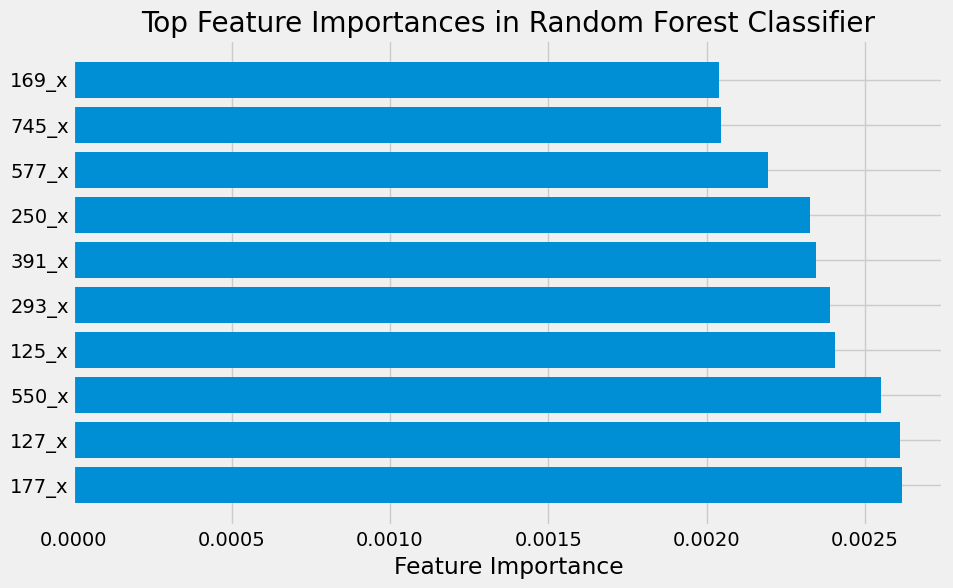

In [ ]:
# Get feature importances
feature_importances_1 = rf_clf_1.feature_importances_

# Get the indices of the features sorted by importance
sorted_indices = feature_importances_1.argsort()[::-1]

# Get the top N feature names and importances
top_n = 10
feature_names = X.columns
top_feature_names_1 = [feature_names[i] for i in sorted_indices[:top_n]]
feature_importances_1 = feature_importances_1[sorted_indices[:top_n]]

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(range(top_n), feature_importances_1, align='center')
plt.yticks(range(top_n), top_feature_names_1)
plt.xlabel('Feature Importance')
plt.title('Top Feature Importances in Random Forest Classifier')
plt.show()

In [ ]:
## Predict on test set and evaluate the model

y_pred_1 = rf_clf_1.predict(X_test)
print(classification_report(y_test, y_pred_1))

              precision    recall  f1-score   support

           0       0.70      0.06      0.10       254
           1       0.78      0.08      0.14       374
           2       0.00      0.00      0.00        80
           3       0.00      0.00      0.00        53
           4       0.78      0.06      0.11       438
           5       0.44      0.03      0.05       156
           6       0.00      0.00      0.00       145
           7       0.67      0.02      0.04       105
           8       0.75      0.25      0.37       558
           9       0.80      0.11      0.20       462
          10       0.58      0.04      0.08       167
          11       0.53      0.03      0.05       338
          12       0.00      0.00      0.00        46
          13       0.67      0.02      0.03       125
          14       0.67      0.03      0.05       388
          15       0.25      0.01      0.02       217
          16       0.73      0.15      0.25       554
          17       0.33    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### 3.3 Arguments and topics as features

In [ ]:
## Create our features matrix X by combining argument embeddings, topics, and correlation scores

argument_embeddings_df = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/argument_embeddings.parquet')

# Merge argument_embeddings_df based on the outcome of the topic modeling
X = argument_embeddings_df.merge(df_topics_BERT[['Argument ID','BERTopic_adj']].set_index('Argument ID'),
                                                     left_index=True, right_index=True)

X = X.drop('Argument ID', axis=1)
X.columns

Index(['0_x', '1_x', '2_x', '3_x', '4_x', '5_x', '6_x', '7_x', '8_x', '9_x',
       ...
       '759_x', '760_x', '761_x', '762_x', '763_x', '764_x', '765_x', '766_x',
       '767_x', 'BERTopic_adj'],
      dtype='object', length=769)

In [ ]:
## Fit RF classifier

y = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/y_dataset_BERT.parquet')

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=14)

rf_clf_0 = RandomForestClassifier(n_estimators=100, random_state=14)
rf_clf_0.fit(X_train, y_train)

RandomForestClassifier(random_state=14)

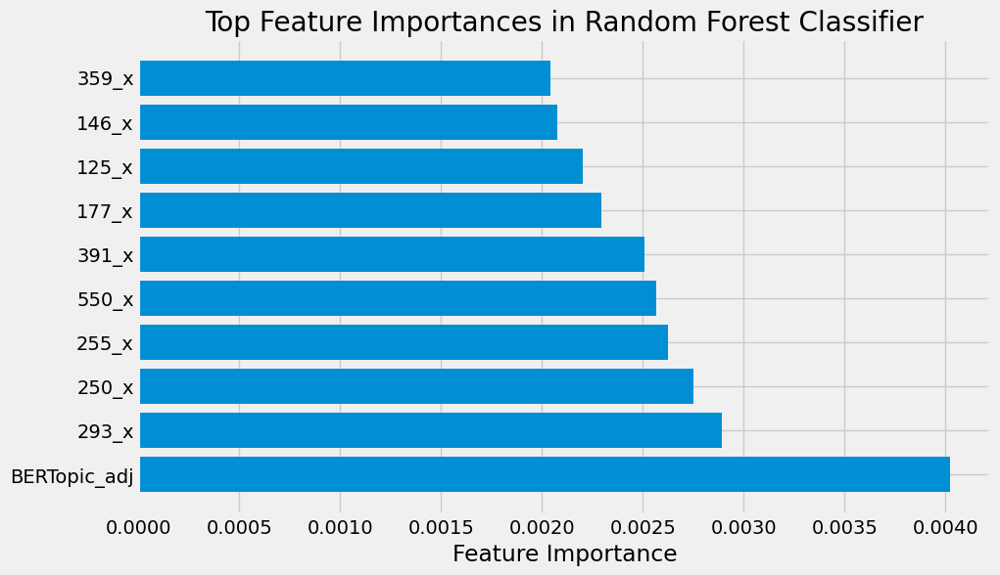

In [ ]:
# Get feature importances
feature_importances_0 = rf_clf_0.feature_importances_

# Get the indices of the features sorted by importance
sorted_indices = feature_importances_0.argsort()[::-1]

# Get the top N feature names and importances
top_n = 10
feature_names = X.columns
top_feature_names_0 = [feature_names[i] for i in sorted_indices[:top_n]]
feature_importances_0 = feature_importances_0[sorted_indices[:top_n]]

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(range(top_n), feature_importances_0, align='center')
plt.yticks(range(top_n), top_feature_names_0)
plt.xlabel('Feature Importance')
plt.title('Top Feature Importances in Random Forest Classifier')
plt.show()

In [ ]:
## Predict on test set and evaluate the model

y_pred_0 = rf_clf_0.predict(X_test)
print(classification_report(y_test, y_pred_0))

              precision    recall  f1-score   support

           0       0.80      0.06      0.12       129
           1       0.85      0.09      0.17       181
           2       0.50      0.02      0.05        41
           3       0.00      0.00      0.00        26
           4       0.75      0.08      0.14       238
           5       0.25      0.01      0.03        74
           6       0.00      0.00      0.00        79
           7       0.00      0.00      0.00        53
           8       0.70      0.25      0.37       268
           9       0.86      0.14      0.24       226
          10       0.44      0.05      0.08        88
          11       0.62      0.03      0.06       169
          12       0.00      0.00      0.00        21
          13       0.50      0.01      0.03        71
          14       0.58      0.04      0.07       193
          15       0.00      0.00      0.00        96
          16       0.71      0.14      0.24       271
          17       0.50    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
## Fit RF classifier (topics embeddings)

X = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/X_dataset_BERT.parquet').iloc[:, :-20]
y = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/y_dataset_BERT.parquet')

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=14)

rf_clf_2 = RandomForestClassifier(n_estimators=100, random_state=14)
rf_clf_2.fit(X_train, y_train)

RandomForestClassifier(random_state=14)

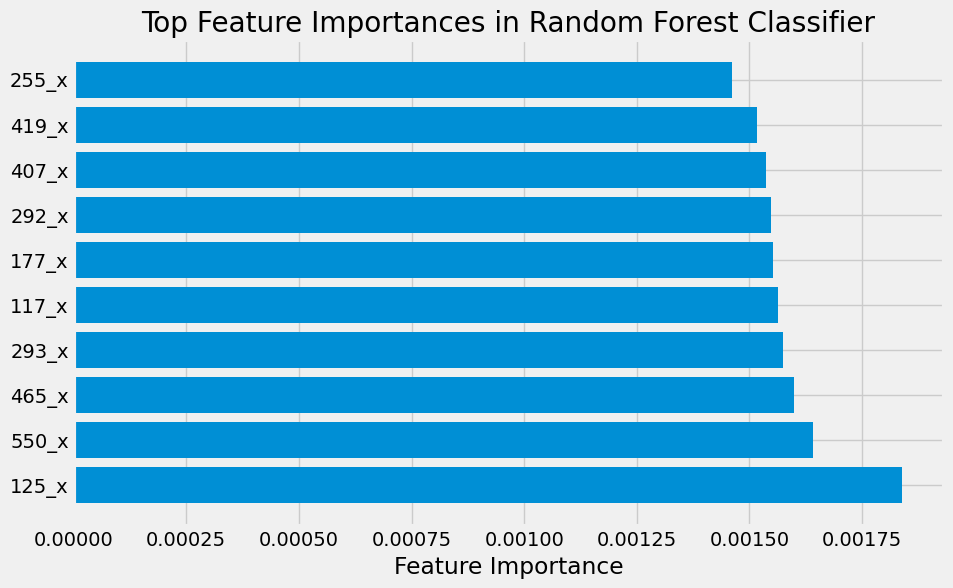

In [ ]:
# Get feature importances
feature_importances_2 = rf_clf_2.feature_importances_

# Get the indices of the features sorted by importance
sorted_indices = feature_importances_2.argsort()[::-1]

# Get the top N feature names and importances
top_n = 10
feature_names = X.columns
top_feature_names_2 = [feature_names[i] for i in sorted_indices[:top_n]]
feature_importances_2 = feature_importances_2[sorted_indices[:top_n]]

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(range(top_n), feature_importances_2, align='center')
plt.yticks(range(top_n), top_feature_names_2)
plt.xlabel('Feature Importance')
plt.title('Top Feature Importances in Random Forest Classifier')
plt.show()

In [ ]:
## Predict on test set and evaluate the model

y_pred_2 = rf_clf_2.predict(X_test)
print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       0.59      0.23      0.33       254
           1       0.70      0.17      0.27       374
           2       0.00      0.00      0.00        80
           3       0.00      0.00      0.00        53
           4       0.74      0.26      0.39       438
           5       0.50      0.03      0.06       156
           6       0.50      0.13      0.21       145
           7       0.67      0.02      0.04       105
           8       0.70      0.43      0.53       558
           9       0.72      0.38      0.50       462
          10       0.71      0.27      0.39       167
          11       0.41      0.05      0.08       338
          12       0.67      0.04      0.08        46
          13       0.67      0.02      0.03       125
          14       0.75      0.11      0.19       388
          15       0.25      0.01      0.02       217
          16       0.70      0.36      0.48       554
          17       0.78    

In [ ]:
## Now we are gonna consider class imbalance

# Initialize and fit the Random Forest classifier with automatic class weights
rf_clf_2_balance = RandomForestClassifier(n_estimators=100, random_state=14, class_weight='balanced')
rf_clf_2_balance.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', random_state=14)

In [ ]:
## Predict on test set and evaluate the model

y_pred_2_balance = rf_clf_2_balance.predict(X_test)
print(classification_report(y_test, y_pred_2_balance))

              precision    recall  f1-score   support

           0       0.65      0.05      0.09       254
           1       0.72      0.05      0.09       374
           2       0.00      0.00      0.00        80
           3       0.00      0.00      0.00        53
           4       0.77      0.08      0.14       438
           5       0.44      0.03      0.05       156
           6       0.00      0.00      0.00       145
           7       0.67      0.02      0.04       105
           8       0.78      0.36      0.49       558
           9       0.81      0.15      0.26       462
          10       0.71      0.07      0.13       167
          11       0.47      0.02      0.04       338
          12       0.00      0.00      0.00        46
          13       0.67      0.02      0.03       125
          14       0.72      0.03      0.06       388
          15       0.25      0.01      0.02       217
          16       0.70      0.25      0.36       554
          17       0.82    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Get feature importances
feature_importances_2 = rf_clf_2_balance.feature_importances_

# Get the indices of the features sorted by importance
sorted_indices = feature_importances_2.argsort()[::-1]

# Get the top N feature names and importances
top_n = 10
feature_names = X.columns
top_feature_names_2 = [feature_names[i] for i in sorted_indices[:top_n]]
feature_importances_2 = feature_importances_2[sorted_indices[:top_n]]

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(range(top_n), feature_importances_2, align='center')
plt.yticks(range(top_n), top_feature_names_2)
plt.xlabel('Feature Importance')
plt.title('Top Feature Importances in Random Forest Classifier')
plt.show()

In [ ]:
## Another approach

# Create a dictionary to store individual classifiers
label_classifiers = {}

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=14)

# Loop through each label
for label_index in range(20):
    # Create a binary target for the current label
    binary_target = y_train.iloc[:, label_index]

    # Create a RF classifier for the current label
    classifier = RandomForestClassifier(n_estimators=100, random_state=14)

    # Train the classifier
    classifier.fit(X_train, binary_target)

    # Store the classifier for the current label
    label_classifiers[label_index] = classifier

# Initialize an empty array for predictions
num_instances = len(y_test)
predictions = np.zeros((num_instances, 20))

# Loop through each label
for label_index in range(20):
    classifier = label_classifiers[label_index]
    label_prediction = classifier.predict(X_test)
    predictions[:, label_index] = label_prediction

In [ ]:
## Evaluate each label's classifier individually

# Create an empty DataFrame to store classification reports
classification_reports_df_2 = pd.DataFrame(columns=["Label", "Report"])

for label_index in range(20):
    label_true = y_test.iloc[:, label_index]  # True labels for the current label
    label_prediction = predictions[:, label_index]  # Predictions for the current label

    # Calculate classification report for the current label
    report = classification_report(label_true, label_prediction, output_dict=True)

    # Add the label and report to the DataFrame
    classification_reports_df_2 = classification_reports_df_2.append({
        "Label": label_index,
        "Report": report
    }, ignore_index=True)

In [ ]:
classification_reports_df_2

,Label,Report
0,0,"{'0': {'precision': 0.8573508005822417, 'recall': 0.9624183006535948, 'f1-sc..."
1,1,"{'0': {'precision': 0.7818181818181819, 'recall': 0.9737318840579711, 'f1-sc..."
2,2,"{'0': {'precision': 0.94583615436696, 'recall': 0.9992846924177397, 'f1-scor..."
3,3,"{'0': {'precision': 0.9641407307171854, 'recall': 1.0, 'f1-score': 0.9817430..."
4,4,"{'0': {'precision': 0.7613636363636364, 'recall': 0.9663461538461539, 'f1-sc..."
5,5,"{'0': {'precision': 0.896387184730743, 'recall': 0.9947049924357034, 'f1-sco..."
6,6,"{'0': {'precision': 0.9143454038997214, 'recall': 0.9849962490622656, 'f1-sc..."
7,7,"{'0': {'precision': 0.9308005427408412, 'recall': 0.9992716678805535, 'f1-sc..."
8,8,"{'0': {'precision': 0.7330396475770925, 'recall': 0.9043478260869565, 'f1-sc..."
9,9,"{'0': {'precision': 0.7772317772317773, 'recall': 0.9340551181102362, 'f1-sc..."


In [ ]:
## Combine all the results

# Convert DataFrames to NumPy arrays
all_label_true = y_test.to_numpy()
all_label_predictions = predictions

# Flatten the true labels and predictions
flat_true = all_label_true.ravel()
flat_predictions = all_label_predictions.ravel()

# Calculate and print the overall classification report
overall_report = classification_report(flat_true, flat_predictions)
print("Overall Classification Report:\n", overall_report)

Overall Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.98      0.92     24484
           1       0.69      0.22      0.34      5076

    accuracy                           0.85     29560
   macro avg       0.77      0.60      0.63     29560
weighted avg       0.83      0.85      0.82     29560



The full model that includes correlations between topics and Human values does not seem to add more value in terms of precision and recall

##### 3.3.1 SHAP interpreter

SHAP (SHapley Additive exPlanations) is a powerful and flexible tool for explaining the output of any machine learning model. It is based on the concept of game theory and provides insights into how each feature contributes to the prediction for each class, which can be particularly useful for understanding complex models like those involving text embeddings.

In [ ]:
pip install shap

In [ ]:
import shap

X = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/X_dataset_BERT.parquet').iloc[:, :-20]
y = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/y_dataset_BERT.parquet')

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=14)

rf_clf_2 = RandomForestClassifier(n_estimators=100, random_state=14)
rf_clf_2.fit(X_train, y_train)

X_sample = shap.utils.sample(X_train, nsamples=1000, random_state=14)

# Initialize Tree SHAP explainer
explainer = shap.TreeExplainer(rf_clf_2)

# Calculate SHAP values
shap_values = explainer.shap_values(X_sample)

AttributeError: 'numpy.ndarray' object has no attribute 'to_parquet'

In [ ]:
# Convert the 2D array to a DataFrame with string column names

shap_values_flattened = shap_values.reshape(-1, shap_values.shape[-1])
column_names = [f"column_{i}" for i in range(shap_values_flattened.shape[1])]

shap_values_df = pd.DataFrame(shap_values_flattened, columns=column_names)
shap_values_df.to_parquet('/content/drive/MyDrive/DSE_fp_files/shap_values_df.parquet')

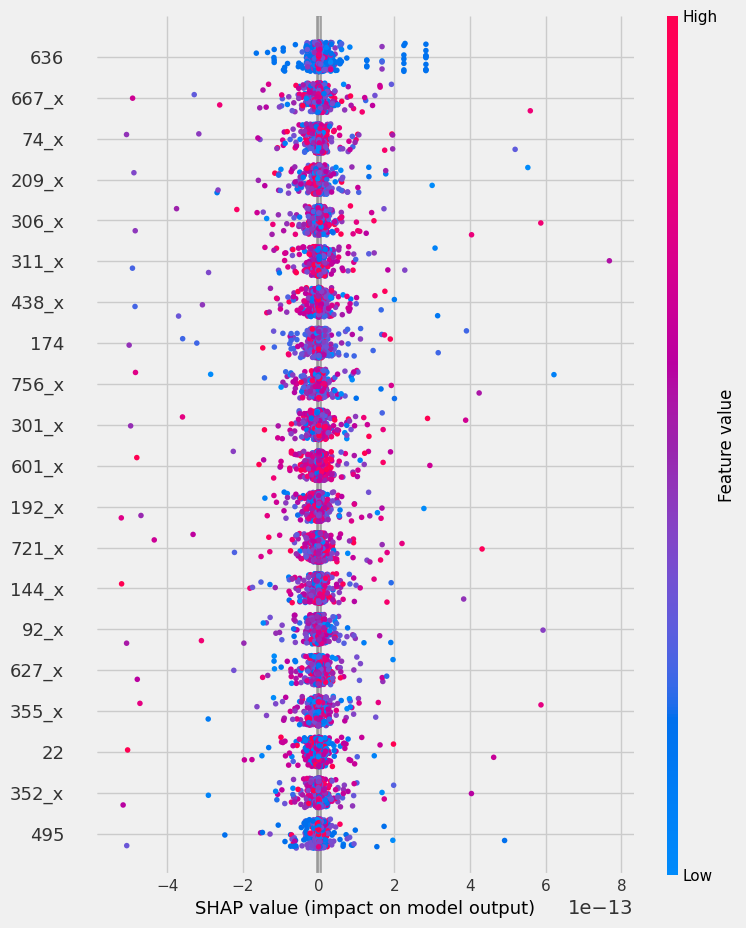

In [ ]:
# Average SHAP values across classes
shap_values_avg = np.mean(shap_values, axis=2)

# Plot SHAP summary plot for the averaged SHAP values
shap.summary_plot(shap_values_avg, X_sample)

In [ ]:
print(X_sample.shape)
print(shap_values.shape)

(1000, 1536)
(1000, 1536, 40)


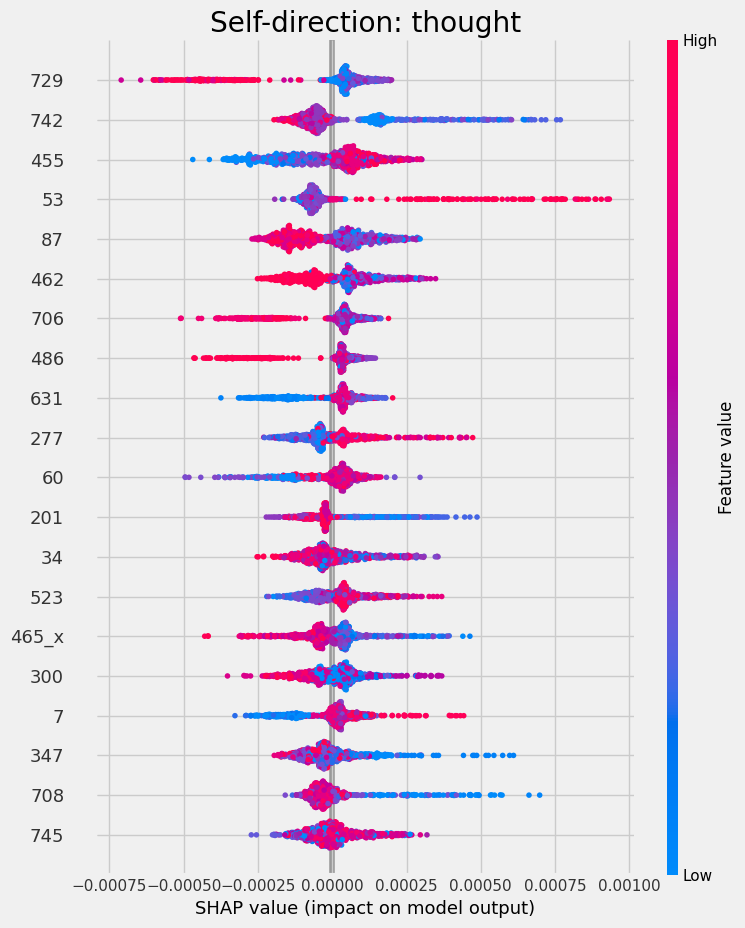

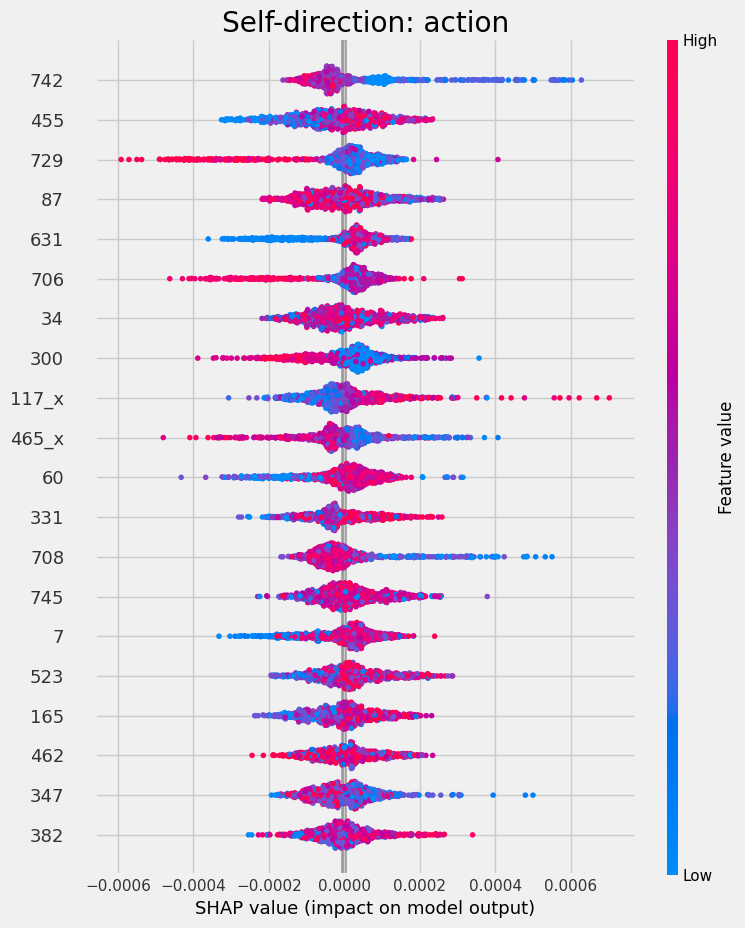

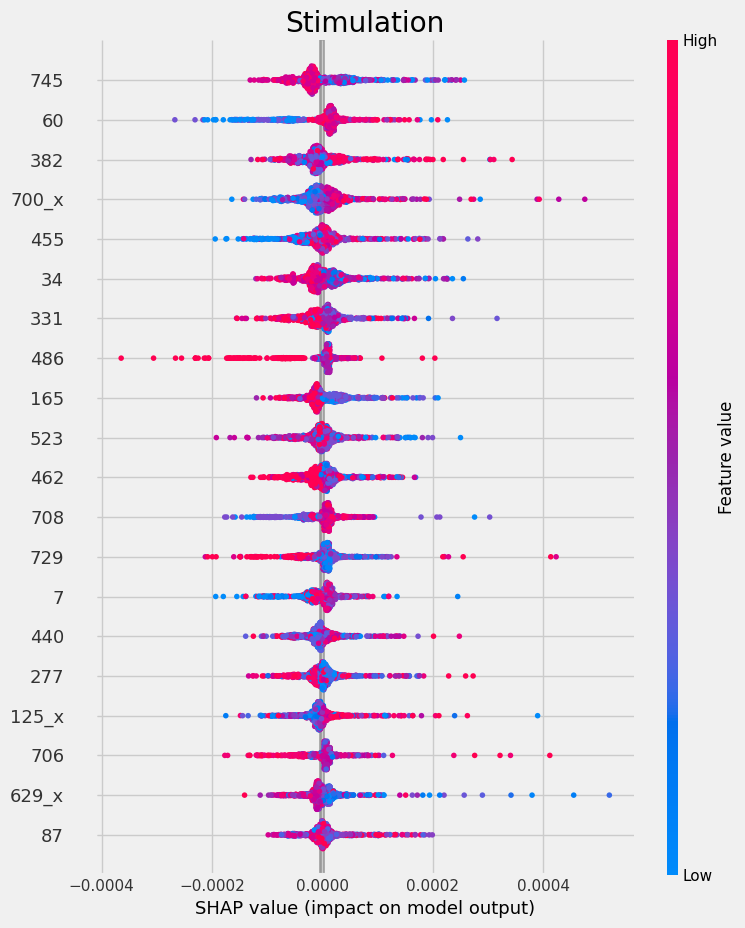

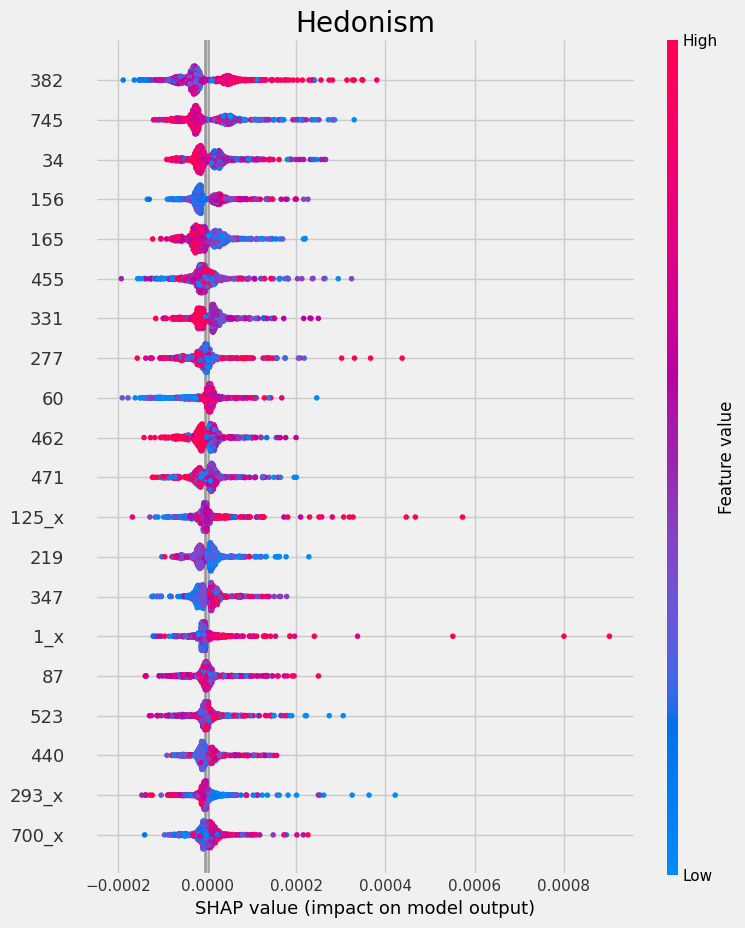

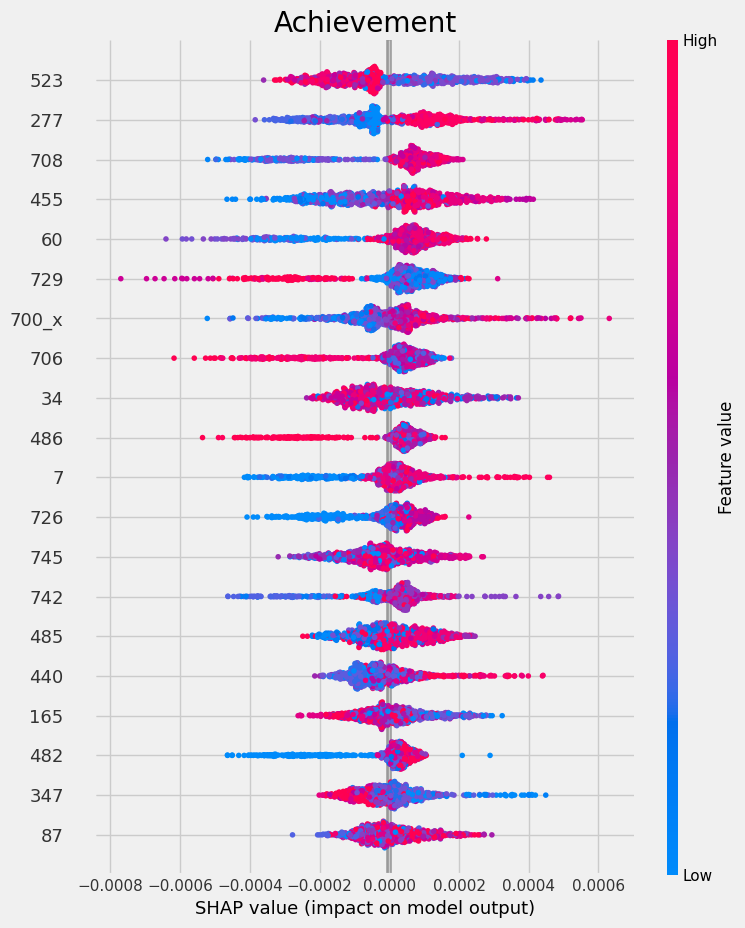

...

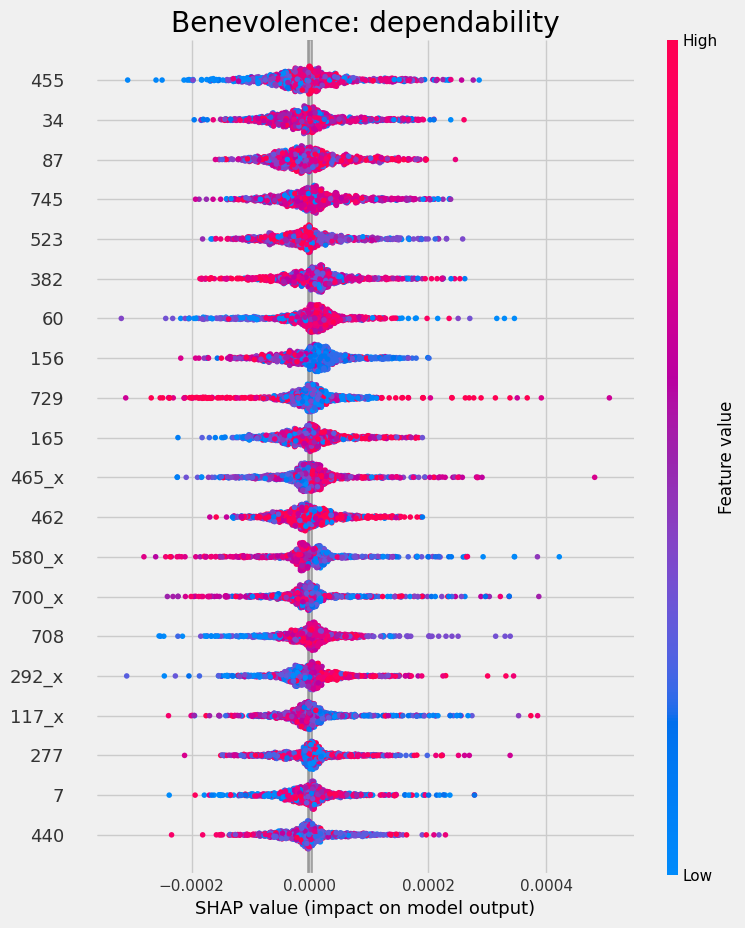

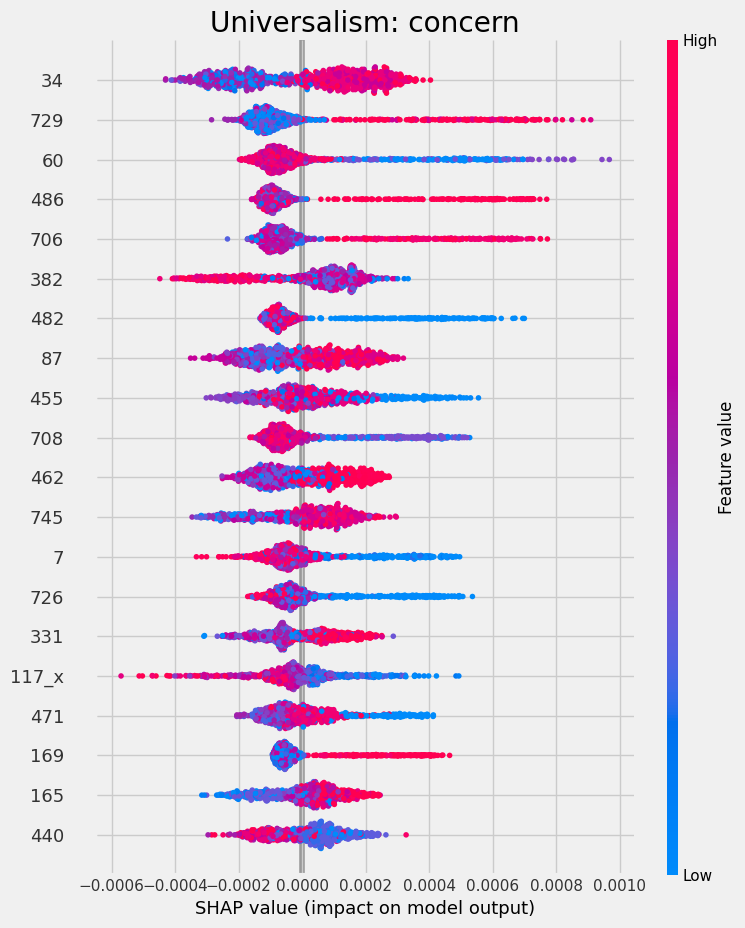

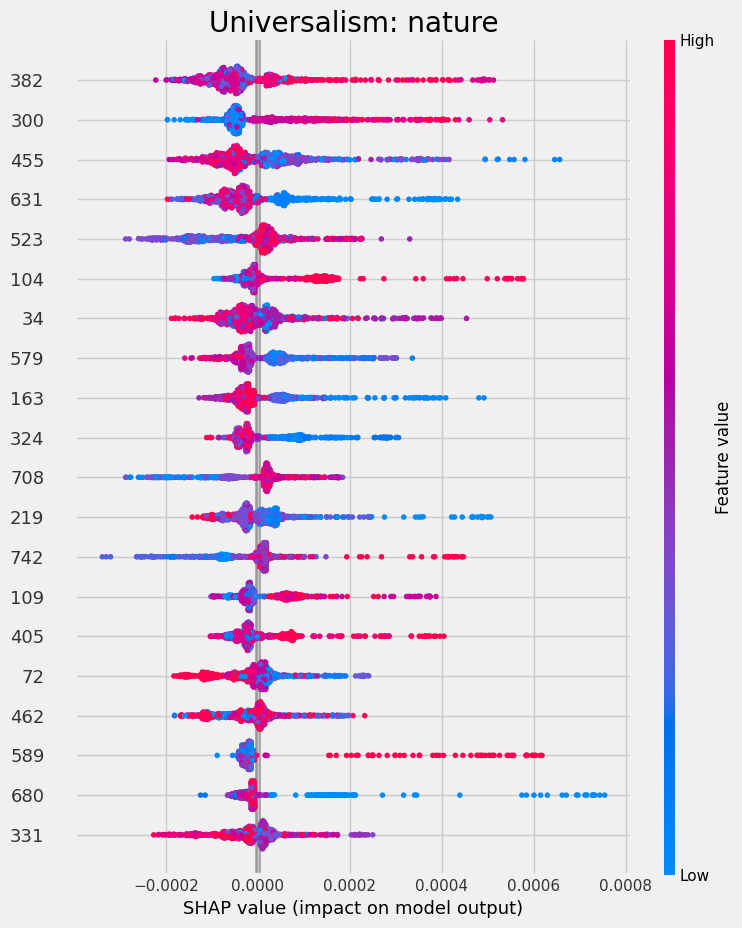

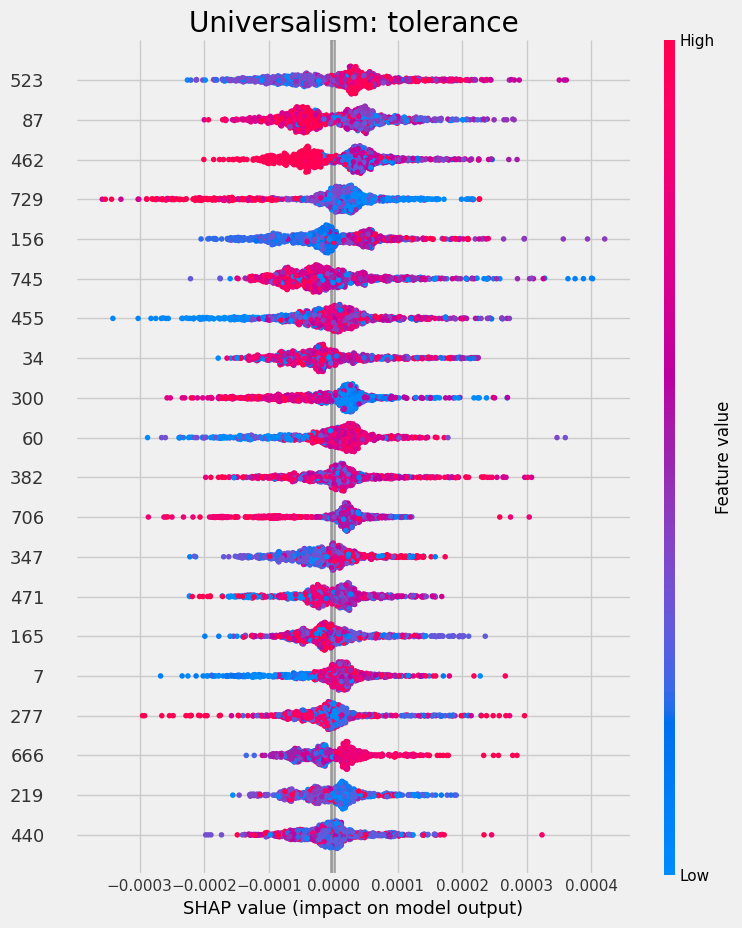

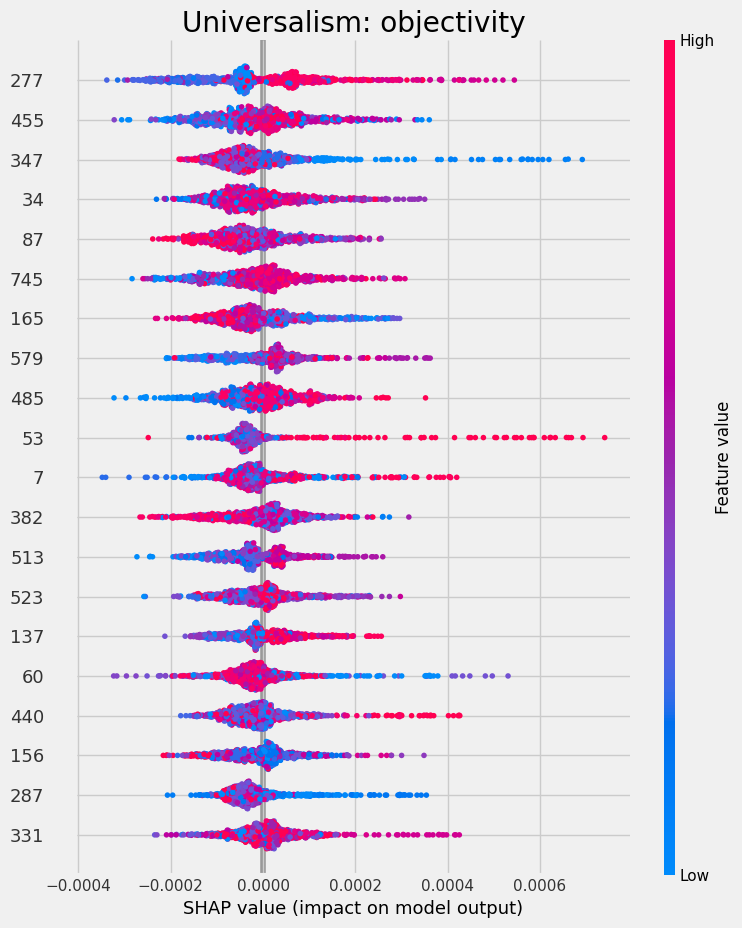

In [ ]:
# Plot SHAP summary plot for each class

for title_idx, class_idx in zip(range(20), range(1, 40, 2)):
    plt.title(y.columns[title_idx])  # Set the title based on the column name
    shap.summary_plot(shap_values[:, :, class_idx], X_sample, show=True)

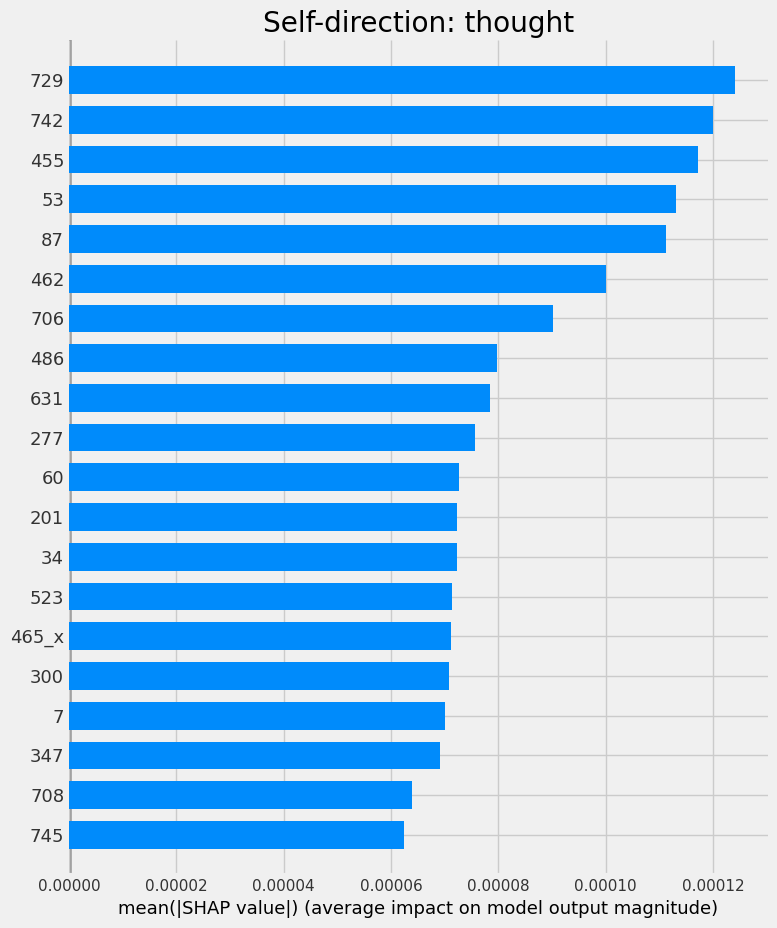

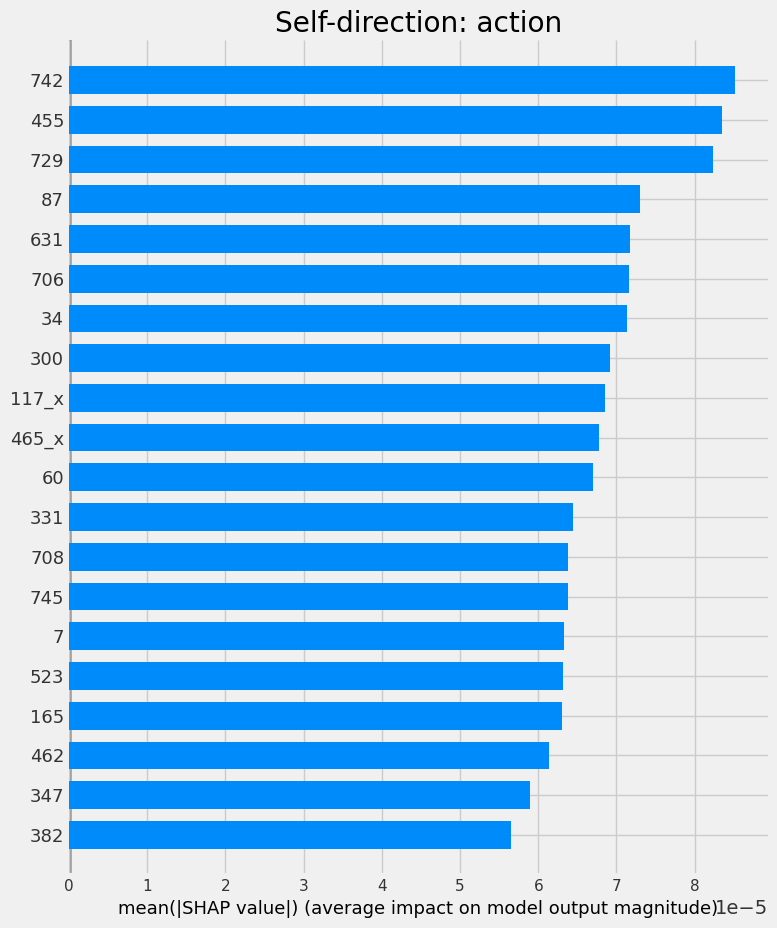

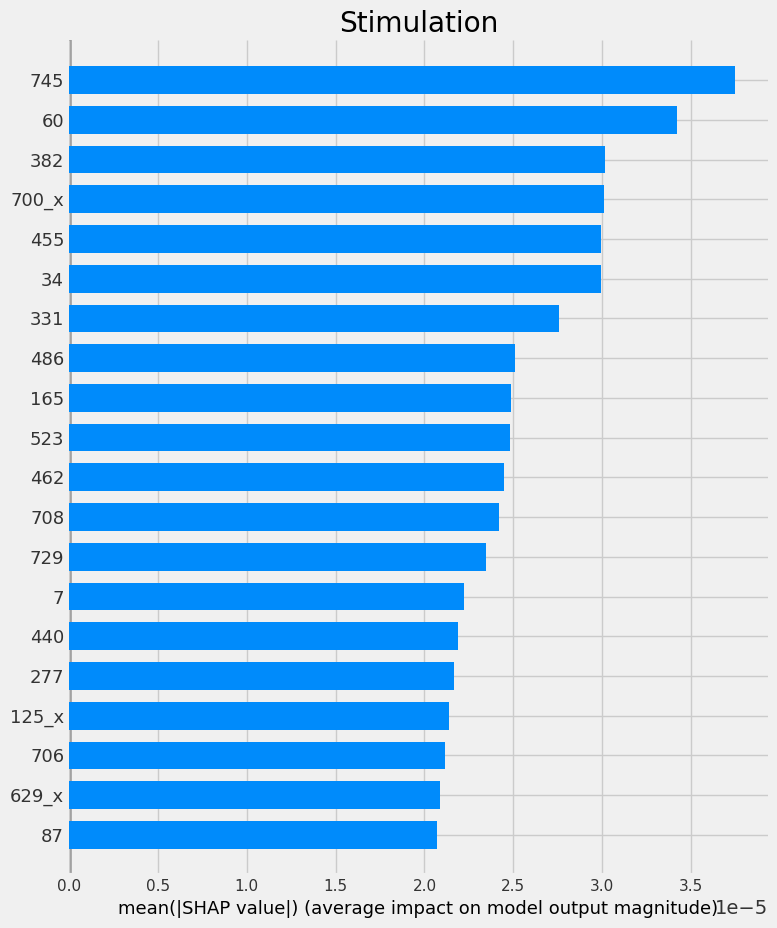

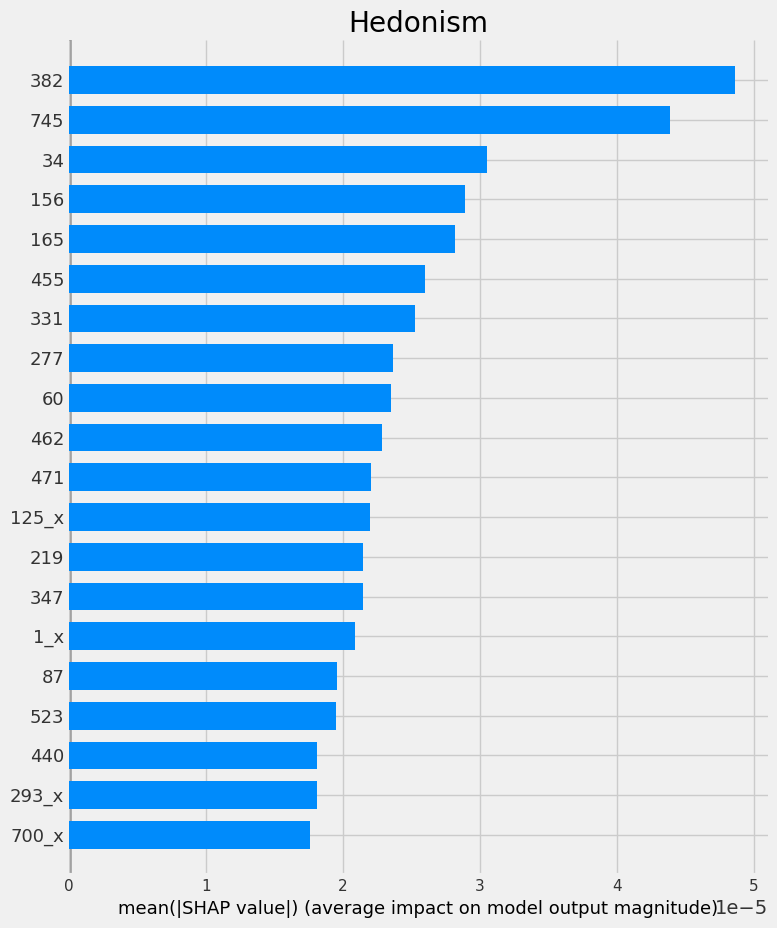

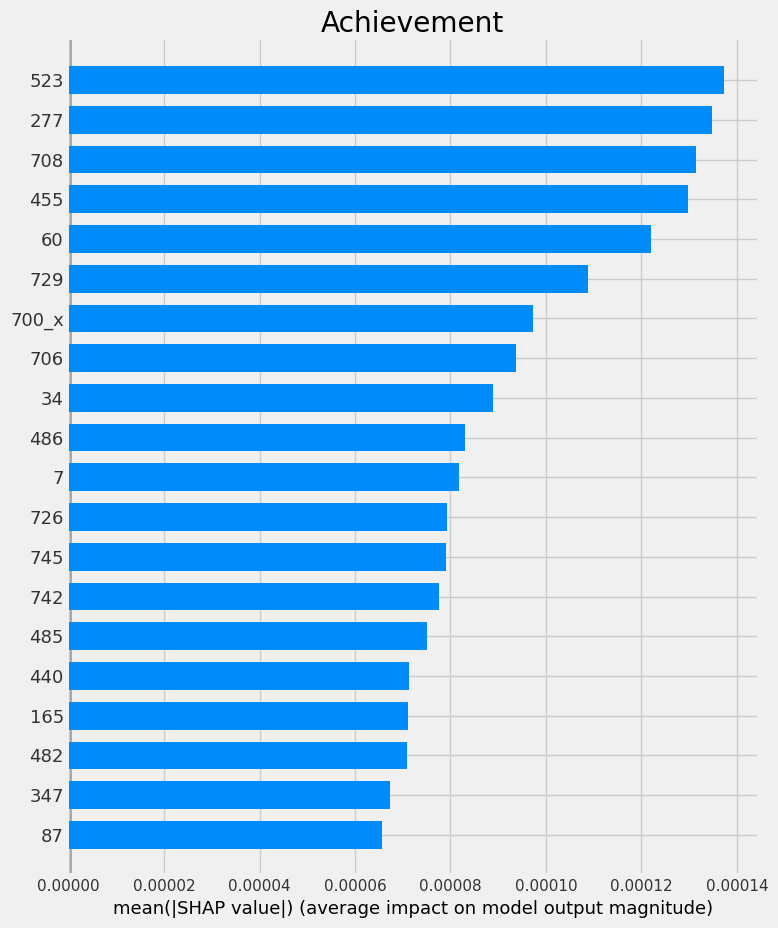

...

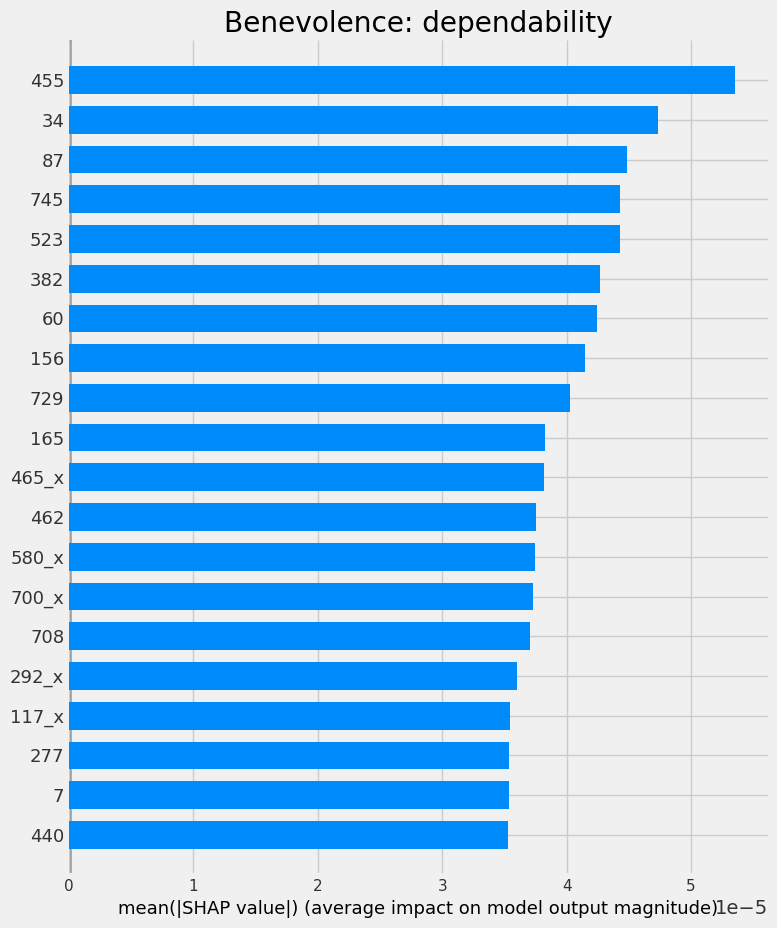

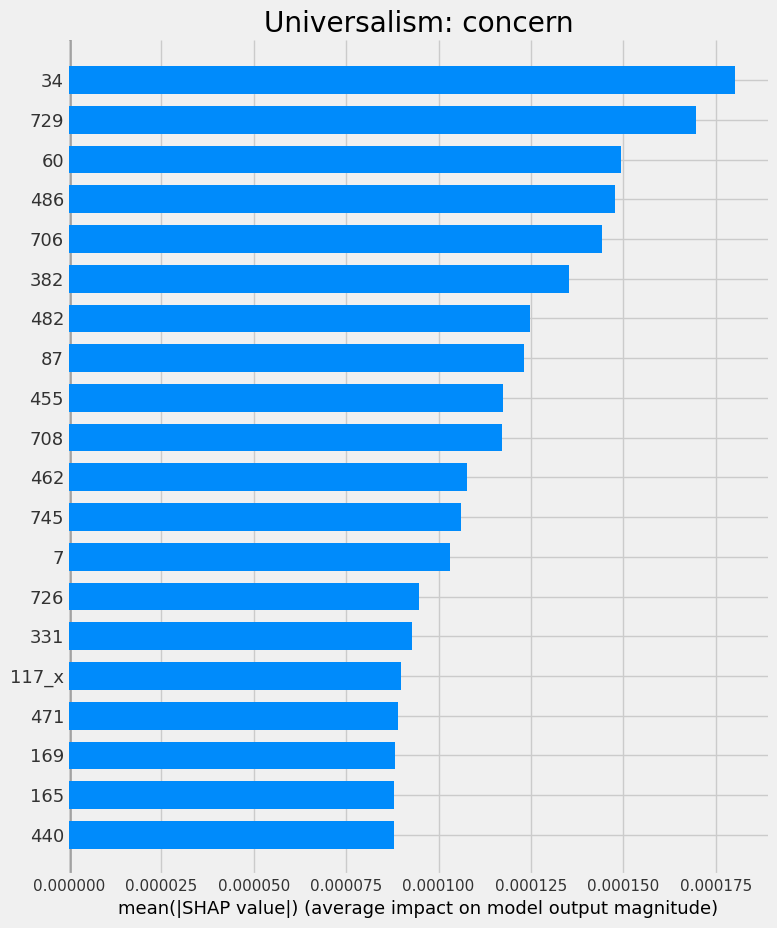

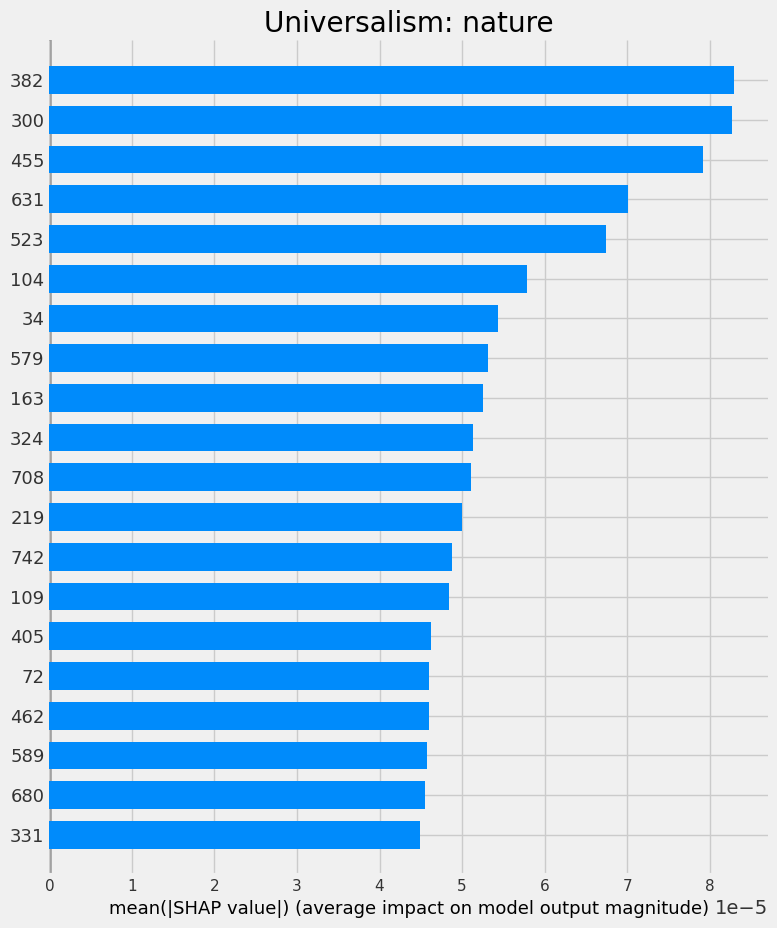

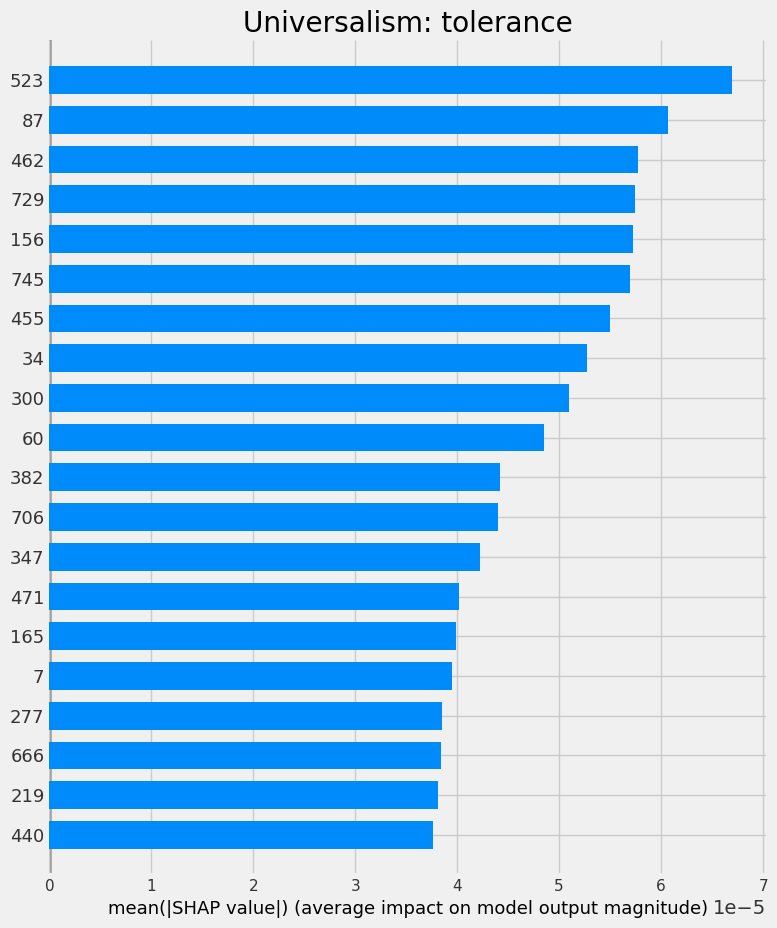

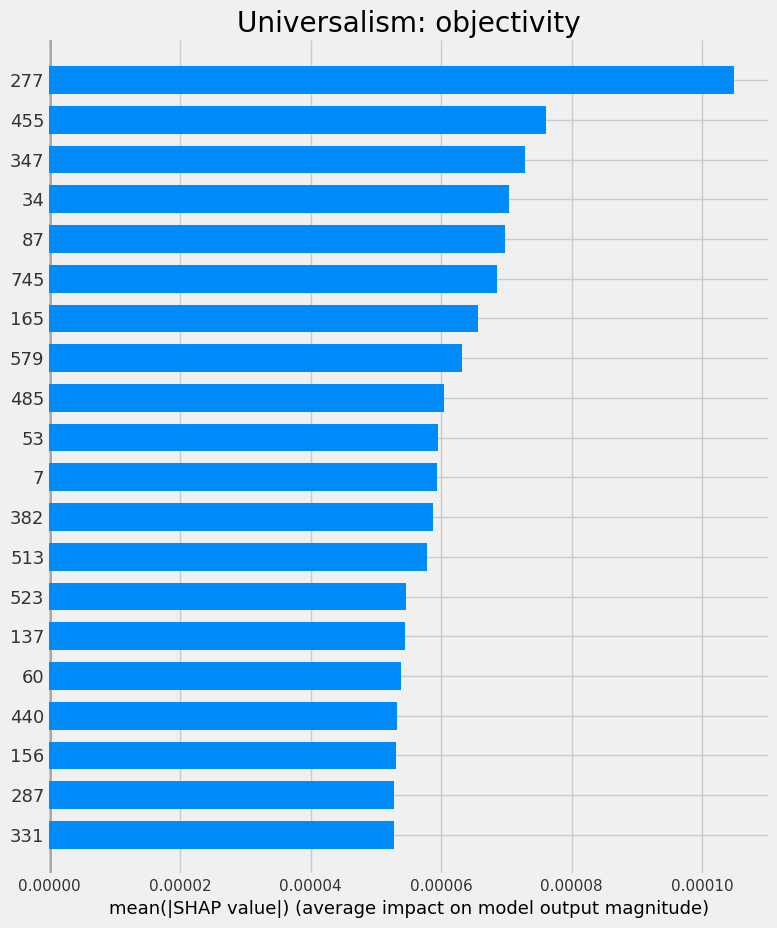

In [ ]:
for title_idx, class_idx in zip(range(20), range(1, 40, 2)):
    plt.title(y.columns[title_idx])  # Set the title based on the column name
    shap.summary_plot(shap_values[:, :, class_idx], X_sample, plot_type='bar', show=True)

#### 3.4 Probability distribution over topics as features

In [89]:
## Create our features matrix X with the probability distribution over topics for each document

X = topic_model_BERTopic.transform(df_topic['Premise_clean'])

In [90]:
df = pd.DataFrame(X[1])

# Generate new column names based on the original column names
new_column_names = [f'topic {col}' for col in df.columns]

# Rename the columns
df.columns = new_column_names

df.head()

,topic 0,topic 1,topic 2,topic 3,topic 4,topic 5,topic 6,topic 7,topic 8,topic 9,...,topic 15,topic 16,topic 17,topic 18,topic 19,topic 20,topic 21,topic 22,topic 23,topic 24
0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,1.733852e-05,0.000007,2.361304e-06,3.963344e-06,2.861199e-06,1.448903e-06,1.956302e-06,3.420599e-06,1.294902e-06,1.818827e-06,...,4.797836e-07,1.232220e-06,1.165704e-06,6.197317e-07,2.373101e-06,2.249958e-06,1.242315e-06,9.389429e-07,1.665203e-06,7.090154e-07
2,1.414489e-01,0.025521,9.272721e-03,1.767343e-02,1.232447e-02,5.678568e-03,8.571993e-03,1.230220e-02,3.289126e-03,7.636768e-03,...,1.797561e-03,6.399740e-03,2.681734e-03,2.017013e-03,4.241073e-03,1.515757e-02,6.925990e-03,3.425299e-03,6.450513e-03,2.416318e-03
3,9.475802e-08,0.891067,1.609213e-08,3.222787e-08,2.207174e-08,1.158369e-08,9.530405e-09,3.053202e-08,5.662914e-09,1.104597e-08,...,2.884199e-09,7.900747e-09,3.213716e-09,5.615887e-09,6.098346e-09,1.524185e-08,8.602729e-09,4.978850e-09,8.367226e-09,7.781730e-09
4,5.696635e-02,0.017947,6.199209e-03,1.103049e-02,7.749145e-03,3.876734e-03,5.826461e-03,8.858930e-03,2.759893e-03,5.394690e-03,...,1.201500e-03,3.665000e-03,2.946505e-03,1.457837e-03,4.174200e-03,6.909955e-03,3.682103e-03,2.365545e-03,4.437999e-03,1.721708e-03


In [91]:
df.shape

(7389, 25)

In [92]:
## Read labels dataset with human values (binary variables)

y = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/y_dataset_BERT.parquet')
y.head()

,Self-direction: thought,Self-direction: action,Stimulation,Hedonism,Achievement,Power: dominance,Power: resources,Face,Security: personal,Security: societal,Tradition,Conformity: rules,Conformity: interpersonal,Humility,Benevolence: caring,Benevolence: dependability,Universalism: concern,Universalism: nature,Universalism: tolerance,Universalism: objectivity
0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0


In [94]:
## Fit the RF model to the training dataset

rf_clf_prob = RandomForestClassifier(n_estimators=100, random_state=14)
rf_clf_prob.fit(df, y)

RandomForestClassifier(random_state=14)

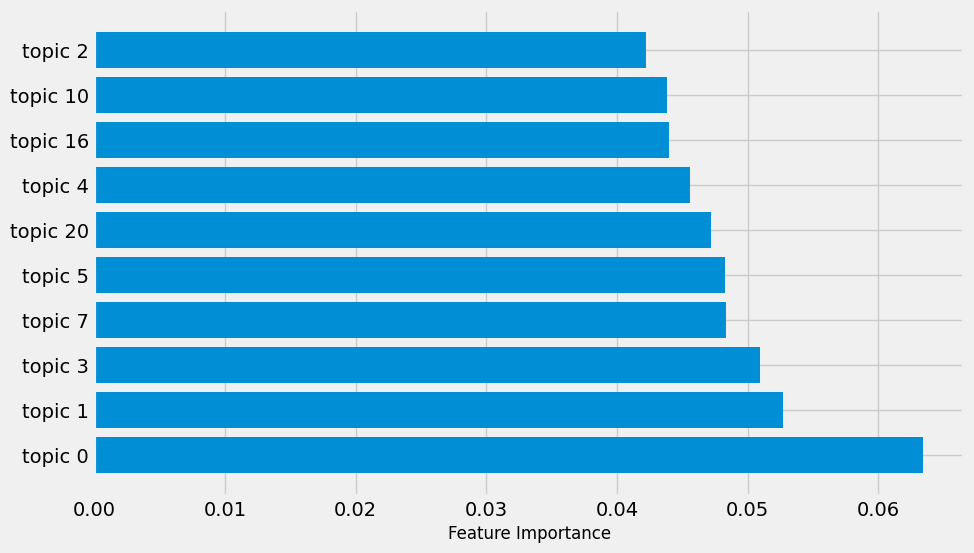

In [95]:
# Get feature importances
feature_importances_prob = rf_clf_prob.feature_importances_

# Get the indices of the features sorted by importance
sorted_indices = feature_importances_prob.argsort()[::-1]

# Get the top N feature names and importances
top_n = 10
feature_names = df.columns
top_feature_names_prob = [feature_names[i] for i in sorted_indices[:top_n]]
feature_importances_prob = feature_importances_prob[sorted_indices[:top_n]]

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(range(top_n), feature_importances_prob, align='center')
plt.yticks(range(top_n), top_feature_names_prob)
plt.xlabel('Feature Importance', fontsize=12)
#plt.title('Top Feature Importances in Random Forest Classifier')
plt.show()

In [116]:
## Create our features matrix X with the probability distribution over topics for each test document

X_test = topic_model_BERTopic.transform(df_topic_test['Premise_clean'])

In [117]:
X_test_input = pd.DataFrame(X_test[1])

# Generate new column names based on the original column names
new_column_names = [f'topic {col}' for col in X_test_input.columns]

# Rename the columns
X_test_input.columns = new_column_names

X_test_input.head()

,topic 0,topic 1,topic 2,topic 3,topic 4,topic 5,topic 6,topic 7,topic 8,topic 9,...,topic 15,topic 16,topic 17,topic 18,topic 19,topic 20,topic 21,topic 22,topic 23,topic 24
0,0.729271,3.370744e-02,1.376153e-02,2.782312e-02,2.001773e-02,7.993267e-03,1.176272e-02,1.413498e-02,3.816351e-03,8.529246e-03,...,2.678157e-03,1.095830e-02,2.856117e-03,2.489298e-03,4.607266e-03,0.031027,1.433779e-02,4.895071e-03,9.164399e-03,2.897326e-03
1,0.000121,2.185494e-08,7.204356e-09,1.620590e-08,9.697448e-09,5.419848e-09,1.308308e-08,1.049121e-08,1.550580e-09,5.975082e-09,...,9.031257e-10,1.603688e-07,1.834592e-09,1.034510e-09,2.069216e-09,0.942906,2.092454e-08,1.730344e-09,4.475117e-09,1.365219e-09
2,0.026229,1.638055e-02,5.510923e-03,9.930472e-03,1.118669e-02,4.860265e-03,2.716955e-03,5.510718e-03,1.705285e-03,2.584607e-03,...,9.839089e-04,2.333996e-03,9.201379e-04,1.688022e-03,1.756990e-03,0.003751,2.444069e-03,1.620203e-03,2.597414e-03,1.560881e-03
3,0.086382,4.619439e-02,1.267570e-02,2.653888e-02,1.754637e-02,8.627716e-03,8.295788e-03,1.796337e-01,4.435585e-03,1.080335e-02,...,2.232383e-03,6.721886e-03,2.775465e-03,3.617378e-03,5.052732e-03,0.014975,7.407209e-03,3.935943e-03,6.936240e-03,5.208673e-03
4,0.095773,2.515604e-01,1.558747e-02,4.709636e-02,2.629962e-02,1.075684e-02,8.973108e-03,2.715560e-02,3.245176e-03,1.256011e-02,...,2.134368e-03,9.311748e-03,2.288129e-03,2.832754e-03,3.641113e-03,0.016437,9.997921e-03,3.472560e-03,6.667495e-03,3.527314e-03


In [109]:
y_test = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/df_test.parquet').iloc[:,4:]
y_test.head()

,Self-direction: thought,Self-direction: action,Stimulation,Hedonism,Achievement,Power: dominance,Power: resources,Face,Security: personal,Security: societal,Tradition,Conformity: rules,Conformity: interpersonal,Humility,Benevolence: caring,Benevolence: dependability,Universalism: concern,Universalism: nature,Universalism: tolerance,Universalism: objectivity
0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1
2,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0


In [118]:
## Predict on test set and evaluate the model

y_pred_prob = rf_clf_prob.predict(X_test_input)
print(classification_report(y_test, y_pred_prob))

              precision    recall  f1-score   support

           0       0.19      0.17      0.18       149
           1       0.32      0.24      0.27       404
           2       0.21      0.04      0.06        79
           3       0.00      0.00      0.00        30
           4       0.31      0.18      0.23       483
           5       0.09      0.03      0.04       113
           6       0.11      0.06      0.08       109
           7       0.19      0.04      0.06       133
           8       0.52      0.40      0.45       603
           9       0.33      0.32      0.33       405
          10       0.29      0.11      0.16       196
          11       0.25      0.17      0.20       306
          12       0.00      0.00      0.00        62
          13       0.06      0.03      0.04        94
          14       0.27      0.16      0.20       362
          15       0.08      0.03      0.05       181
          16       0.38      0.31      0.34       606
          17       0.41    

In [119]:
## Now we are gonna consider class imbalance

# Create a dictionary to store individual classifiers
label_classifiers = {}

# Loop through each label
for label_index in range(20):
    # Create a binary target for the current label
    binary_target = y.iloc[:, label_index]

    # Create a RF classifier for the current label
    classifier = RandomForestClassifier(n_estimators=100, random_state=14)

    # Train the classifier
    classifier.fit(df, binary_target)

    # Store the classifier for the current label
    label_classifiers[label_index] = classifier

# Initialize an empty array for predictions
num_instances = len(y_test)
predictions = np.zeros((num_instances, 20))

# Loop through each label
for label_index in range(20):
    classifier = label_classifiers[label_index]
    label_prediction = classifier.predict(X_test_input)
    predictions[:, label_index] = label_prediction

In [120]:
# Create an empty list to store classification reports
classification_reports = []

for label_index in range(20):
    label_true = y_test.iloc[:, label_index]  # True labels for the current label
    label_prediction = predictions[:, label_index]  # Predictions for the current label

    # Calculate classification report for the current label
    report = classification_report(label_true, label_prediction, output_dict=True)

    # Add the label and report to the list
    classification_reports.append({
        "Label": label_index,
        "Report": report
    })

# Convert the list of dictionaries to a DataFrame
classification_reports_df = pd.DataFrame(classification_reports)

In [121]:
## Combine all the results

# Convert DataFrames to NumPy arrays
all_label_true = y_test.to_numpy()
all_label_predictions = predictions

# Flatten the true labels and predictions
flat_true = all_label_true.ravel()
flat_predictions = all_label_predictions.ravel()

# Calculate and print the overall classification report
overall_report = classification_report(flat_true, flat_predictions)
print("Overall Classification Report:\n", overall_report)

Overall Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.94      0.91     31946
           1       0.33      0.19      0.24      5154

    accuracy                           0.83     37100
   macro avg       0.60      0.56      0.57     37100
weighted avg       0.80      0.83      0.81     37100



In [123]:
y_test.columns

Index(['Self-direction: thought', 'Self-direction: action', 'Stimulation',
       'Hedonism', 'Achievement', 'Power: dominance', 'Power: resources',
       'Face', 'Security: personal', 'Security: societal', 'Tradition',
       'Conformity: rules', 'Conformity: interpersonal', 'Humility',
       'Benevolence: caring', 'Benevolence: dependability',
       'Universalism: concern', 'Universalism: nature',
       'Universalism: tolerance', 'Universalism: objectivity'],
      dtype='object')

In [140]:
# Get the column names from y as human value names
human_value_names = y.columns.tolist()

# Create an empty list to store precision values
precision_values = []

# Iterate over the classification reports DataFrame
for index, row in classification_reports_df.iterrows():
    label = row['Label']  # Get the label index
    precision_label_1 = row['Report']['1']['precision']  # Get the precision value for label 1
    human_value_name = human_value_names[label]  # Get the corresponding human value name
    precision_values.append({'Label': label, 'Human_Value': human_value_name, 'Precision': precision_label_1})

# Create a DataFrame from the list of precision values
precision_df = pd.DataFrame(precision_values)

precision_df

,Label,Human_Value,Precision
0,0,Self-direction: thought,0.233871
1,1,Self-direction: action,0.285714
2,2,Stimulation,0.181818
3,3,Hedonism,0.000000
4,4,Achievement,0.317460
5,5,Power: dominance,0.130435
6,6,Power: resources,0.117647
7,7,Face,0.000000
8,8,Security: personal,0.510022
9,9,Security: societal,0.342640


In [124]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 8.4 MB/s eta 0:00:00


In [125]:
## SHAP interpreter
import shap

X_sample = shap.utils.sample(df, nsamples=1000, random_state=14) # just a sample of the X dataframe

# Initialize Tree SHAP explainer
explainer = shap.TreeExplainer(rf_clf_prob)

# Calculate SHAP values
shap_values = explainer.shap_values(X_sample)

In [126]:
# Convert the 2D array to a DataFrame with string column names

shap_values_flattened = shap_values.reshape(-1, shap_values.shape[-1])
column_names = [f"column_{i}" for i in range(shap_values_flattened.shape[1])]

shap_values_df = pd.DataFrame(shap_values_flattened, columns=column_names)
shap_values_df.to_parquet('/content/drive/MyDrive/DSE_fp_files/shap_values_df_2.parquet')

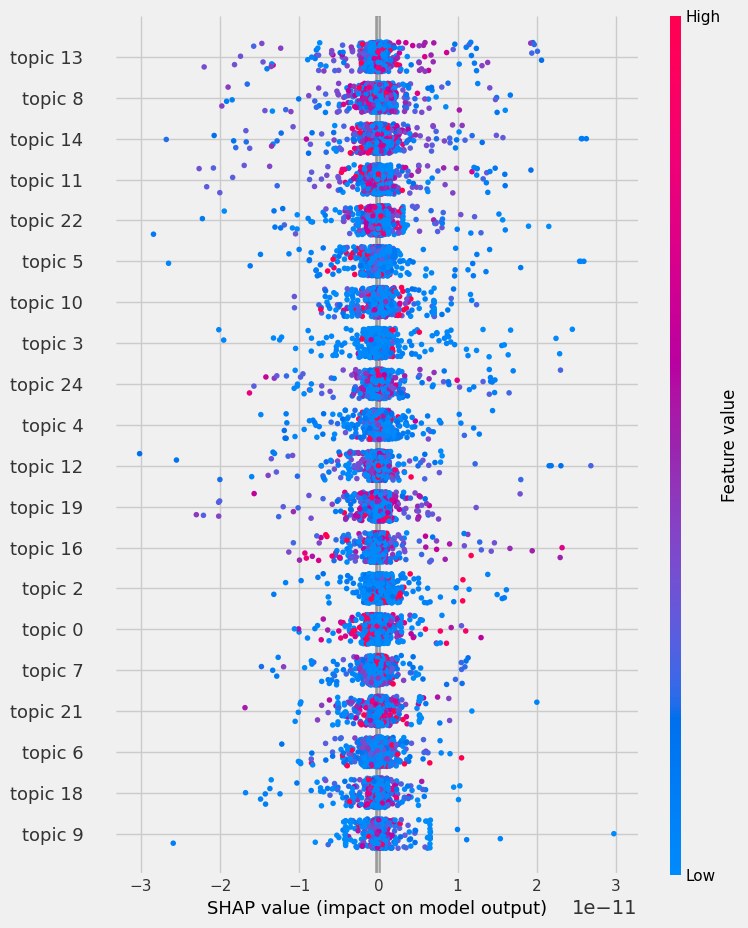

In [127]:
# Average SHAP values across classes
shap_values_avg = np.mean(shap_values, axis=2)

# Plot SHAP summary plot for the averaged SHAP values
shap.summary_plot(shap_values_avg, X_sample)

In [128]:
print(X_sample.shape)
print(shap_values.shape)

(1000, 25)
(1000, 25, 40)


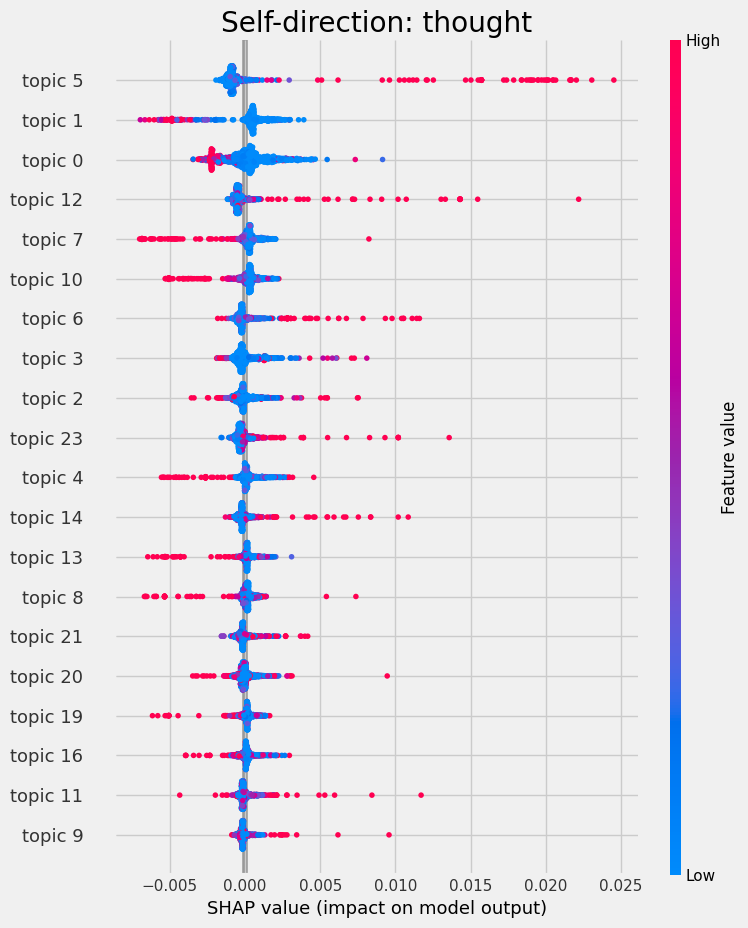

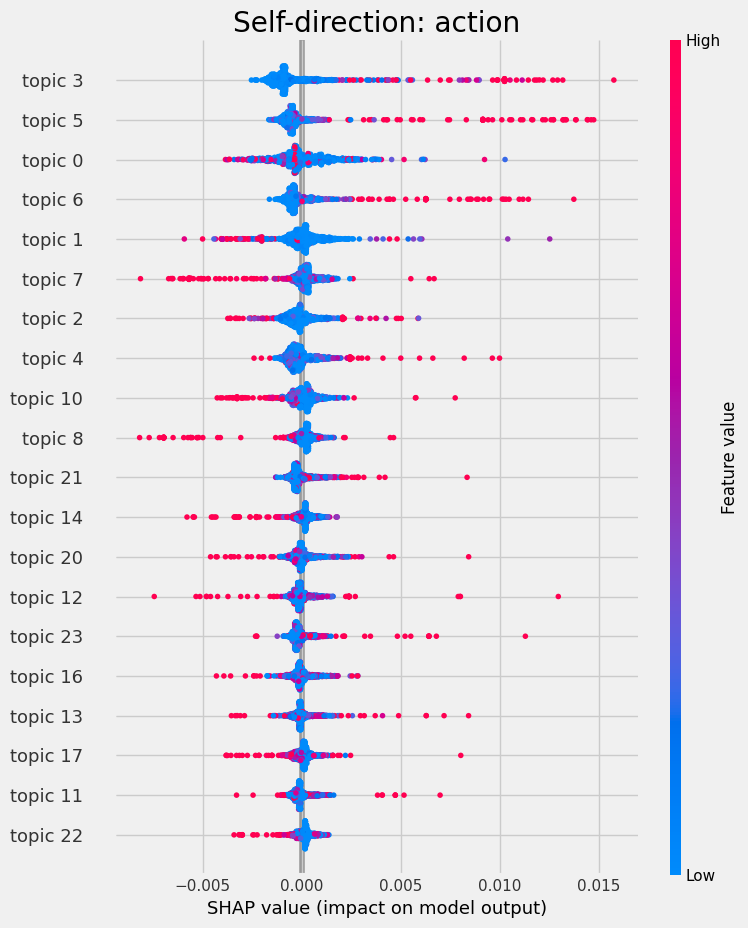

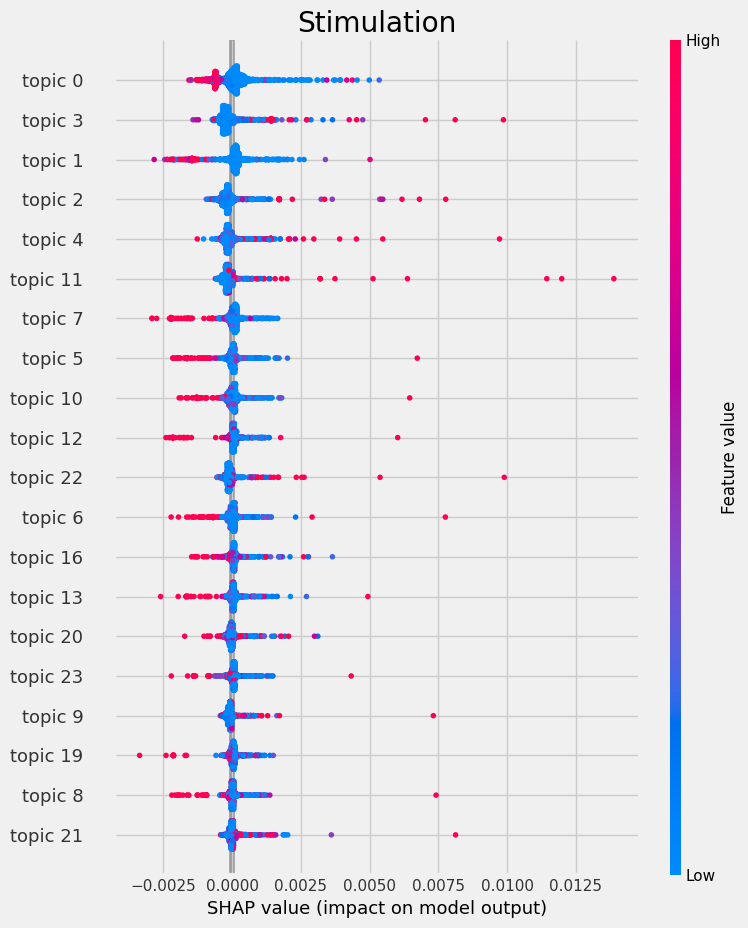

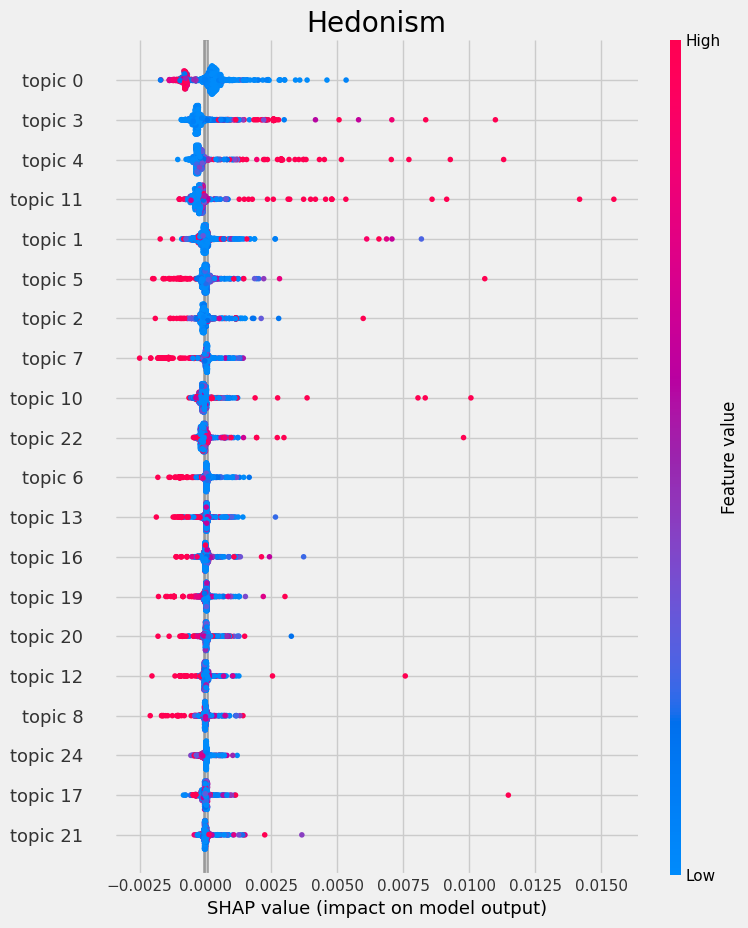

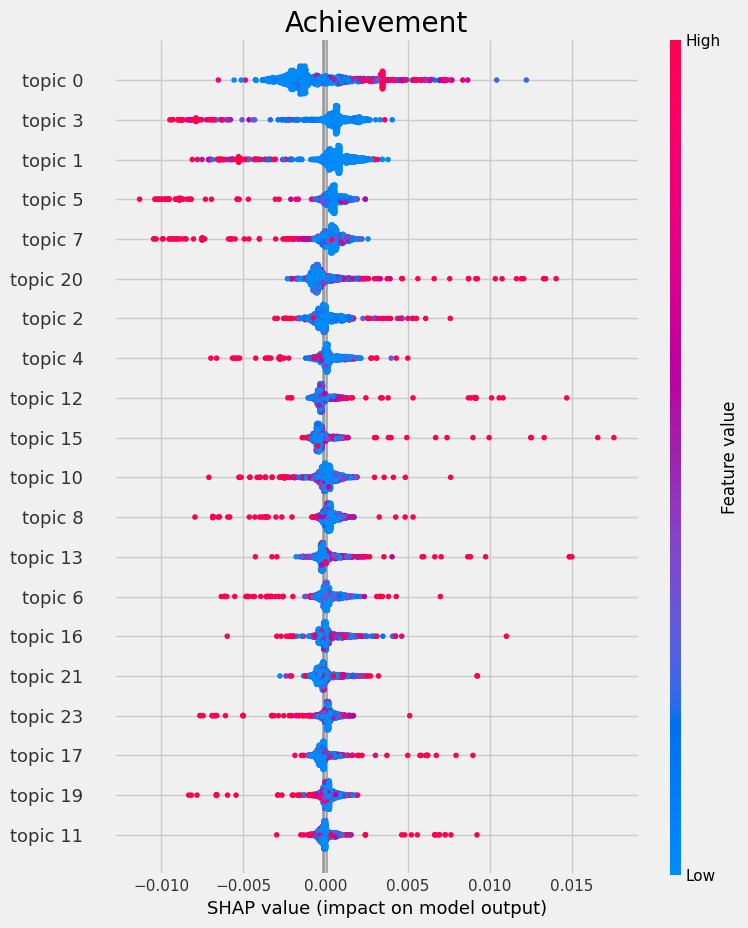

...

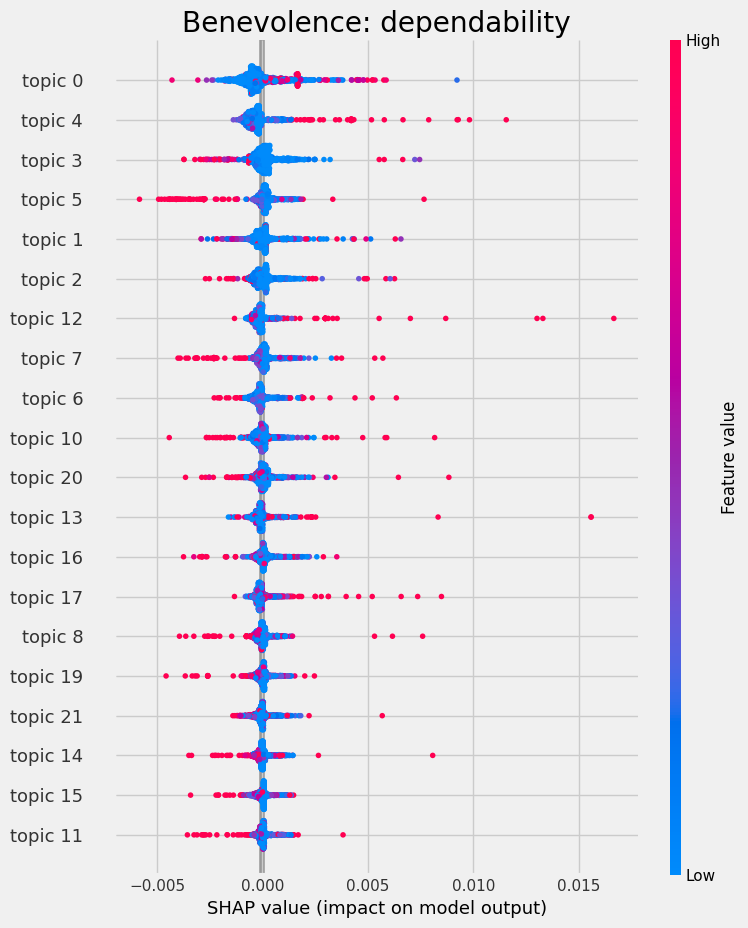

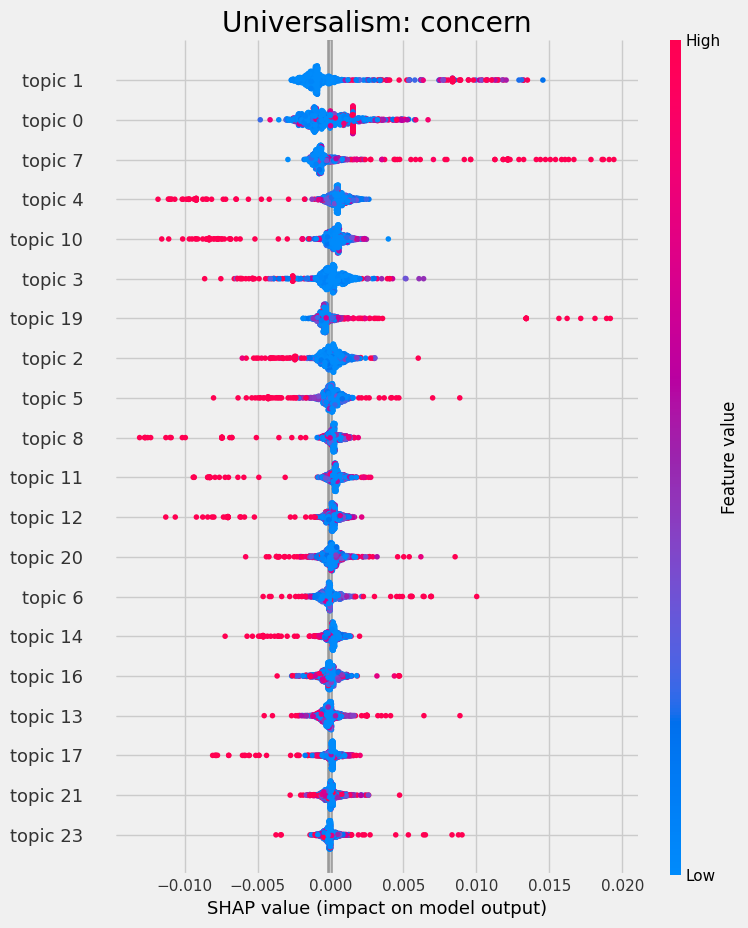

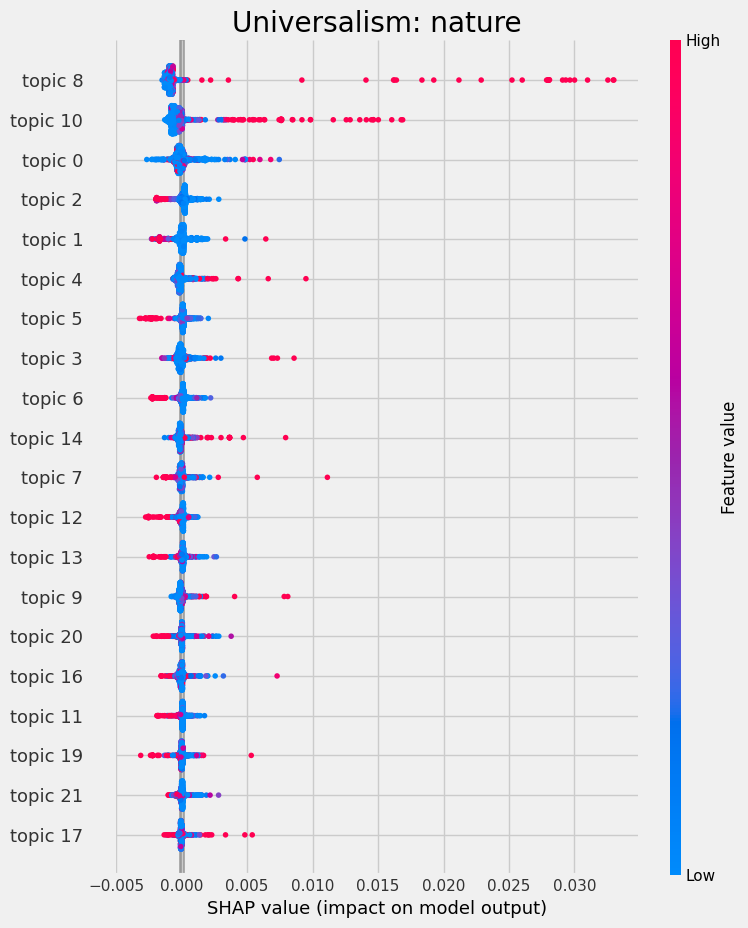

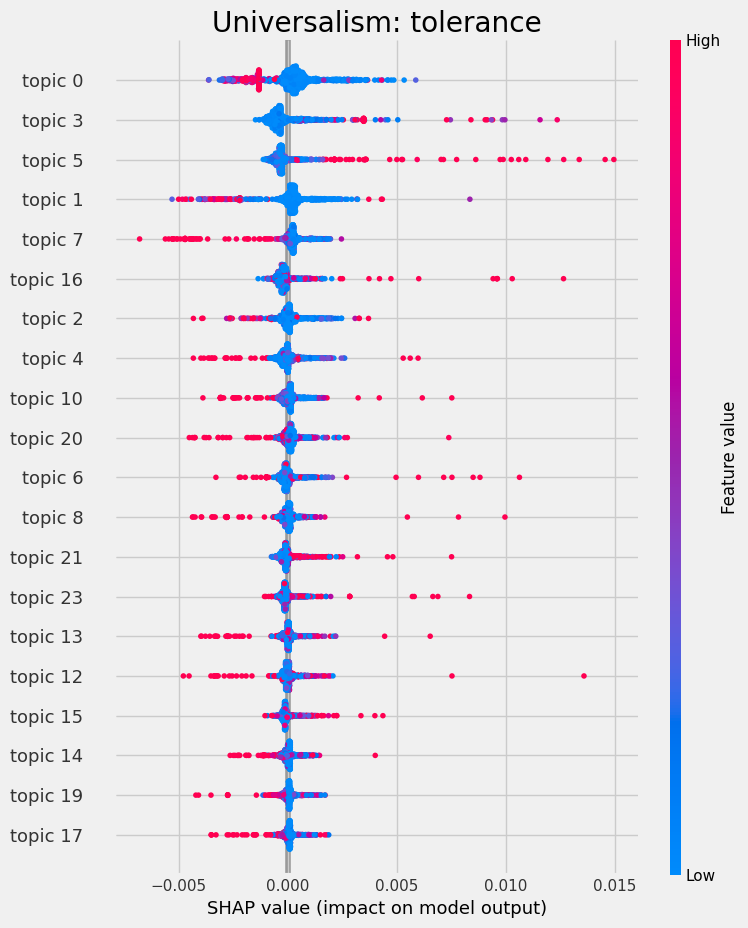

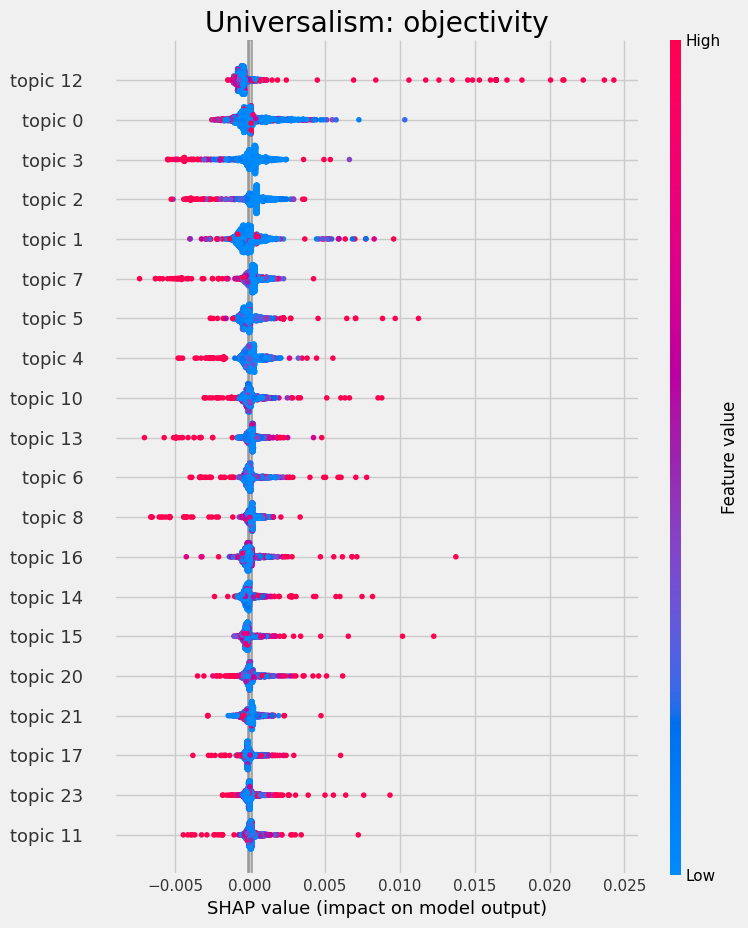

In [129]:
# Plot SHAP summary plot for each class

for title_idx, class_idx in zip(range(20), range(1, 40, 2)):
    plt.title(y.columns[title_idx])  # Set the title based on the column name
    shap.summary_plot(shap_values[:, :, class_idx], X_sample, show=True)

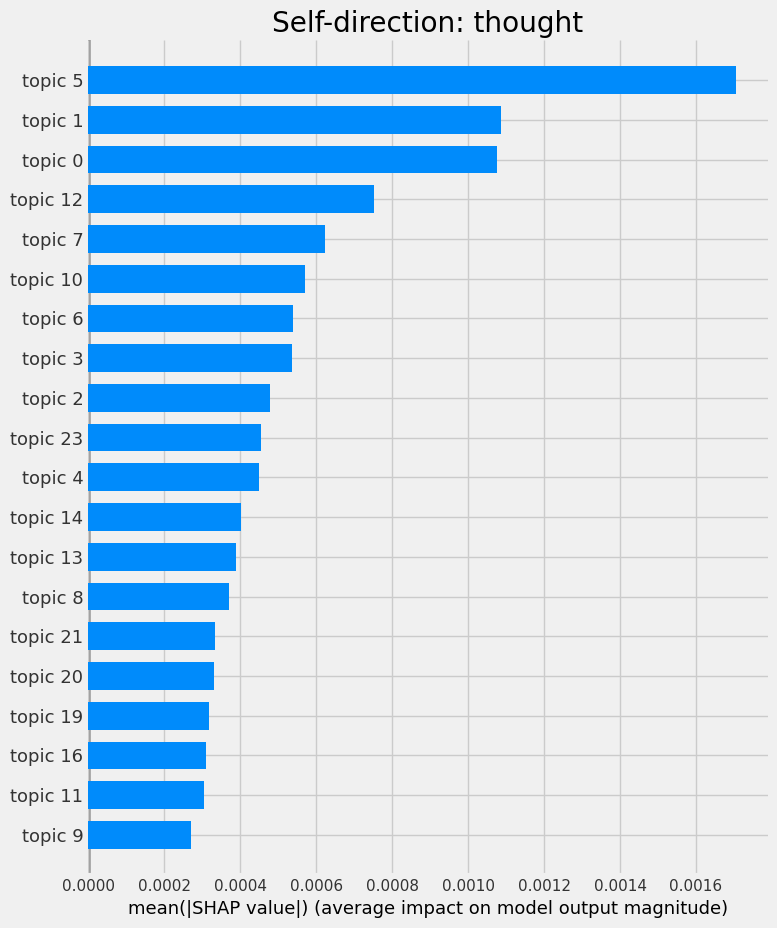

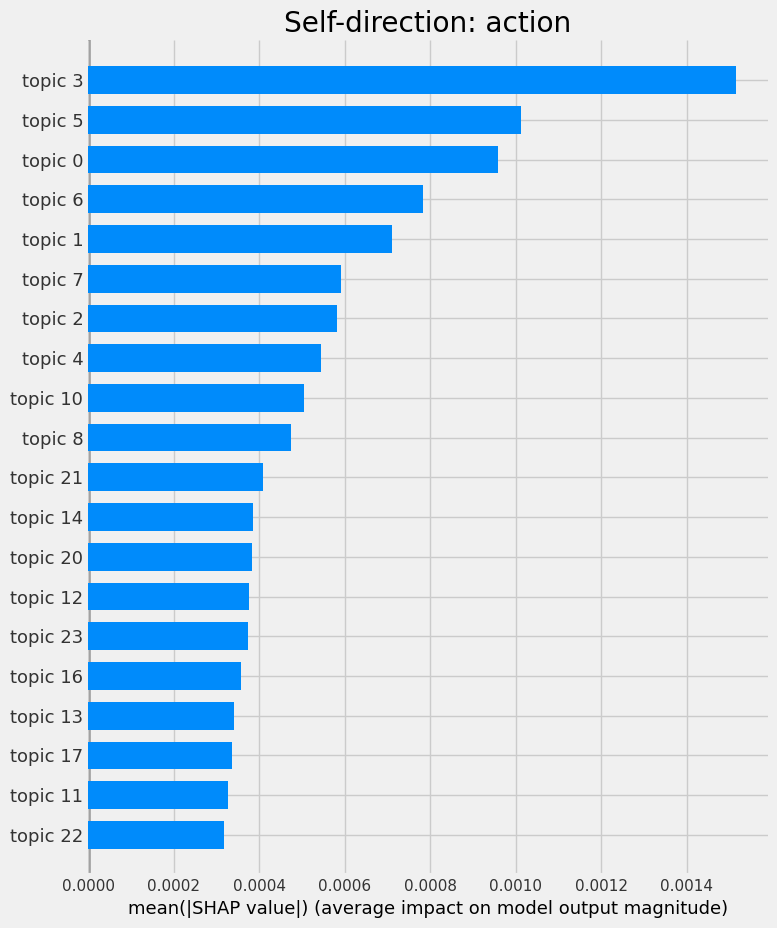

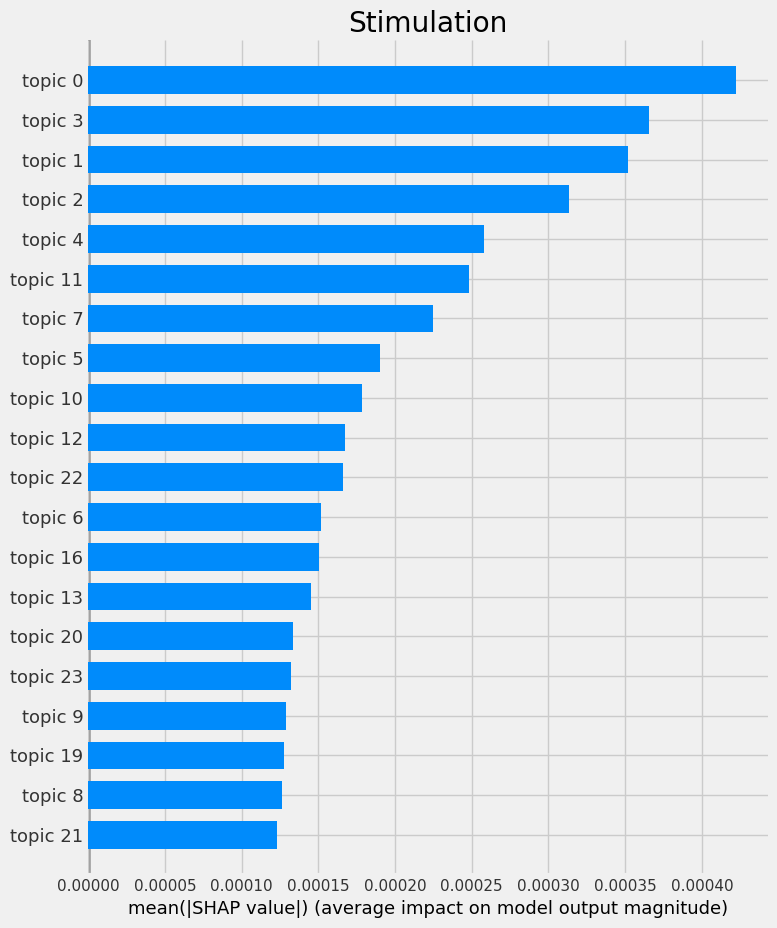

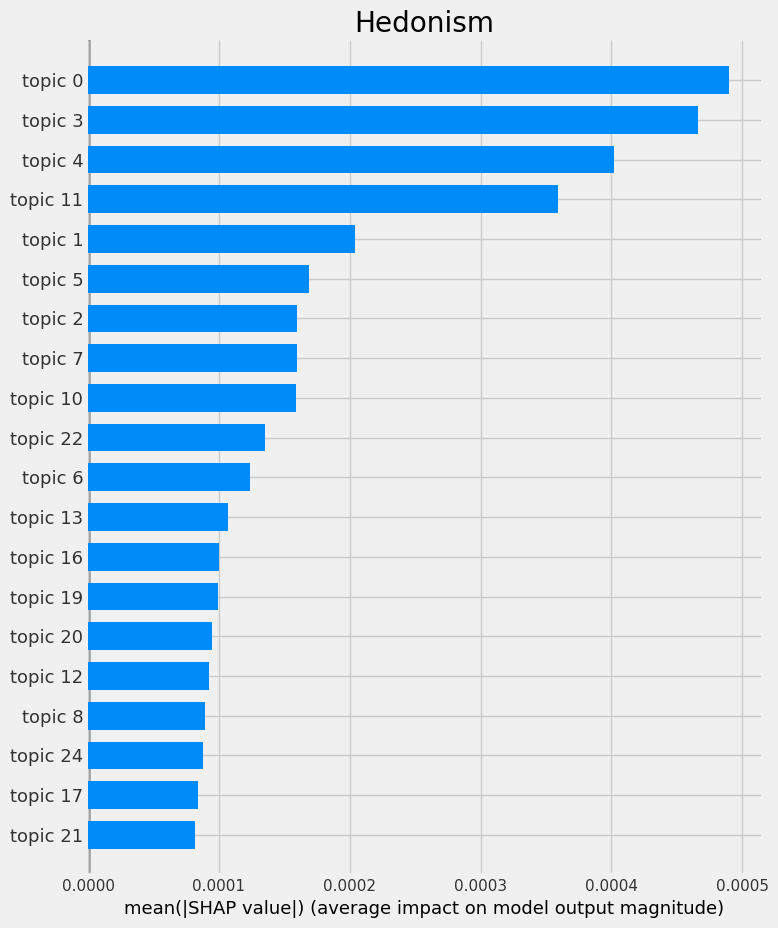

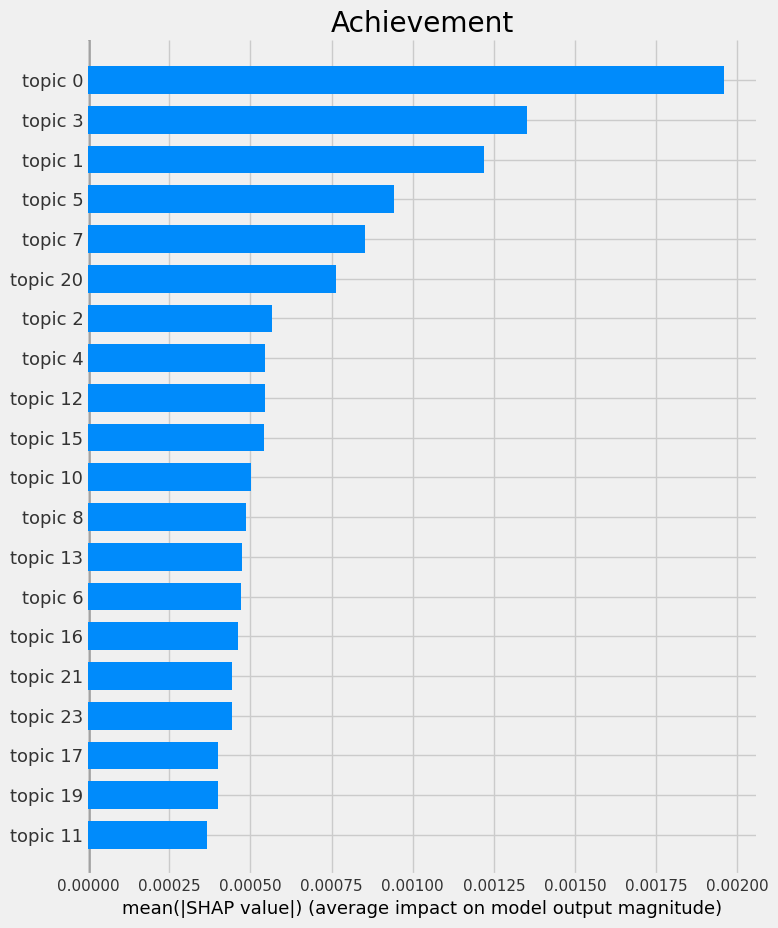

...

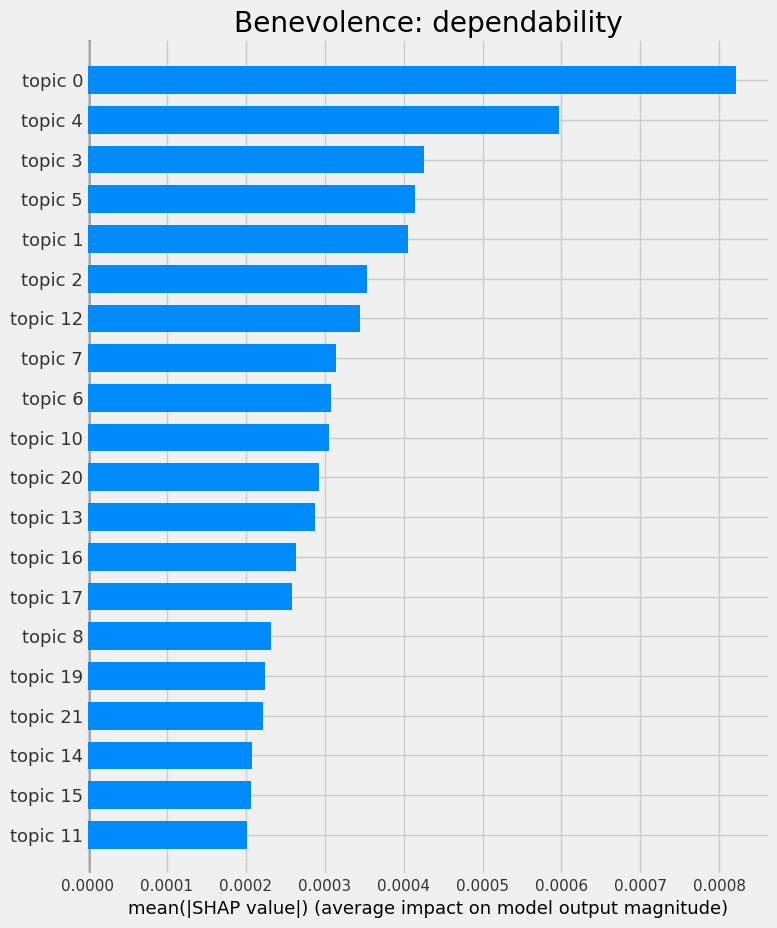

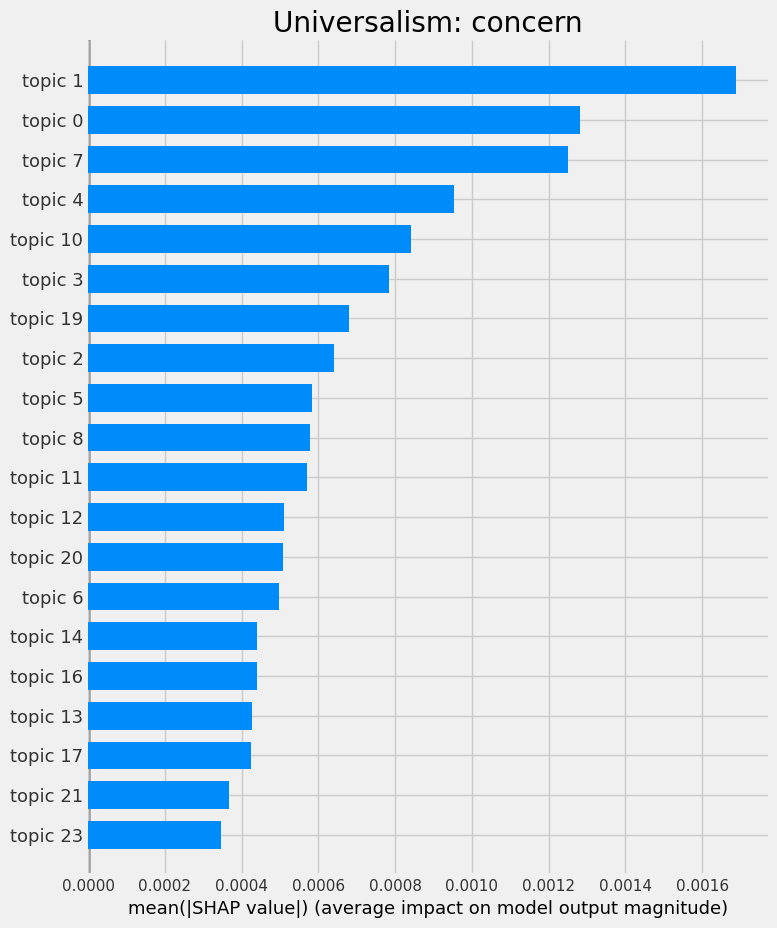

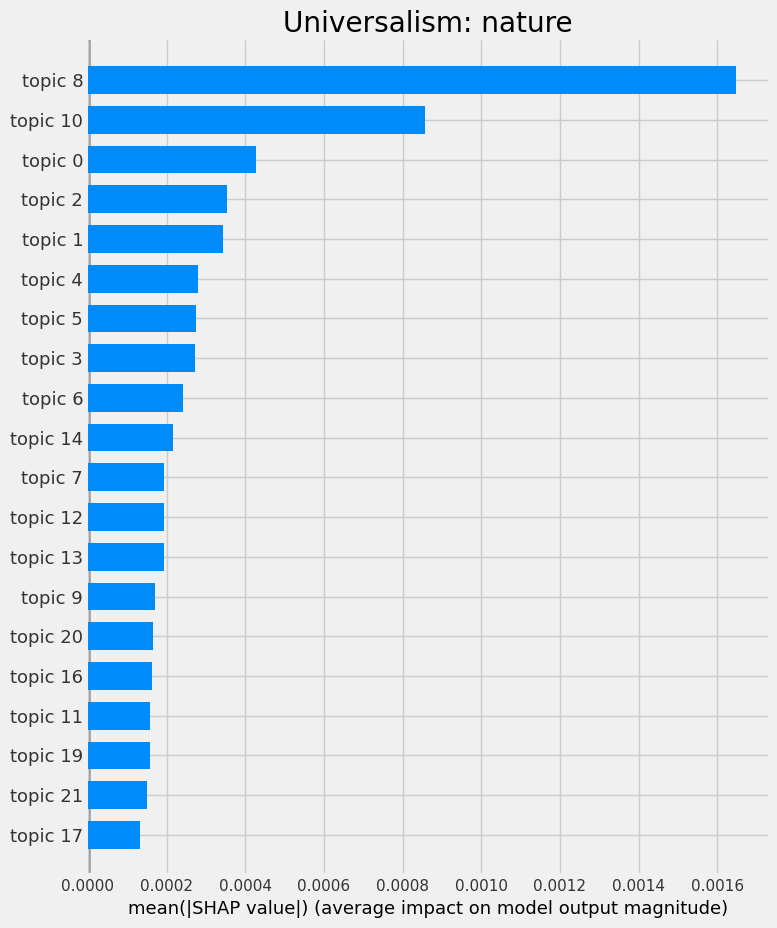

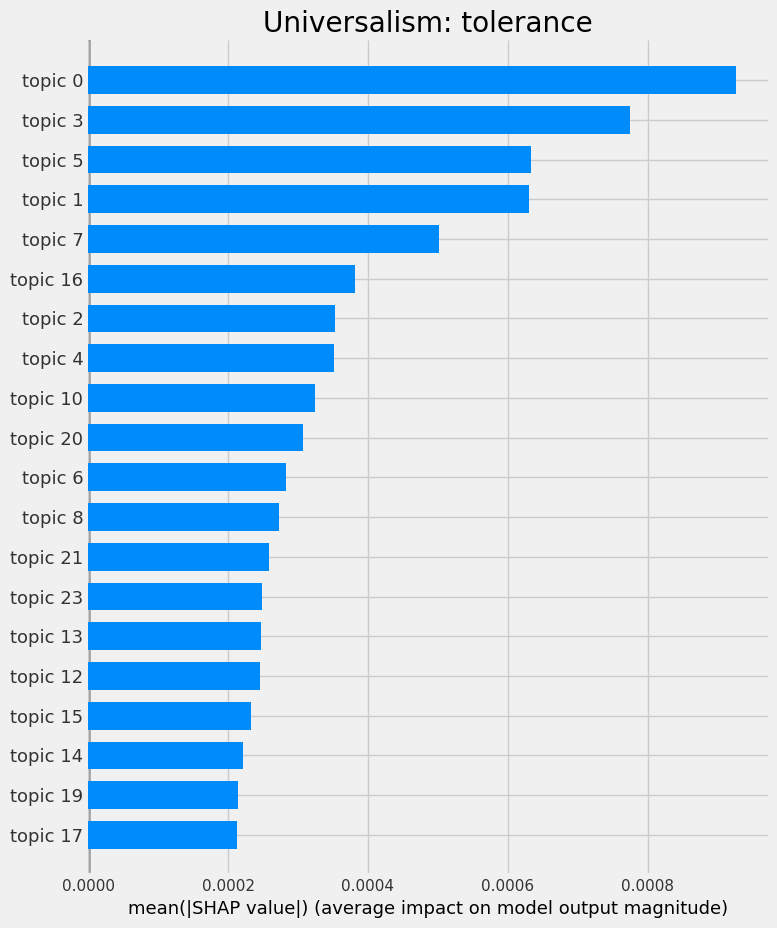

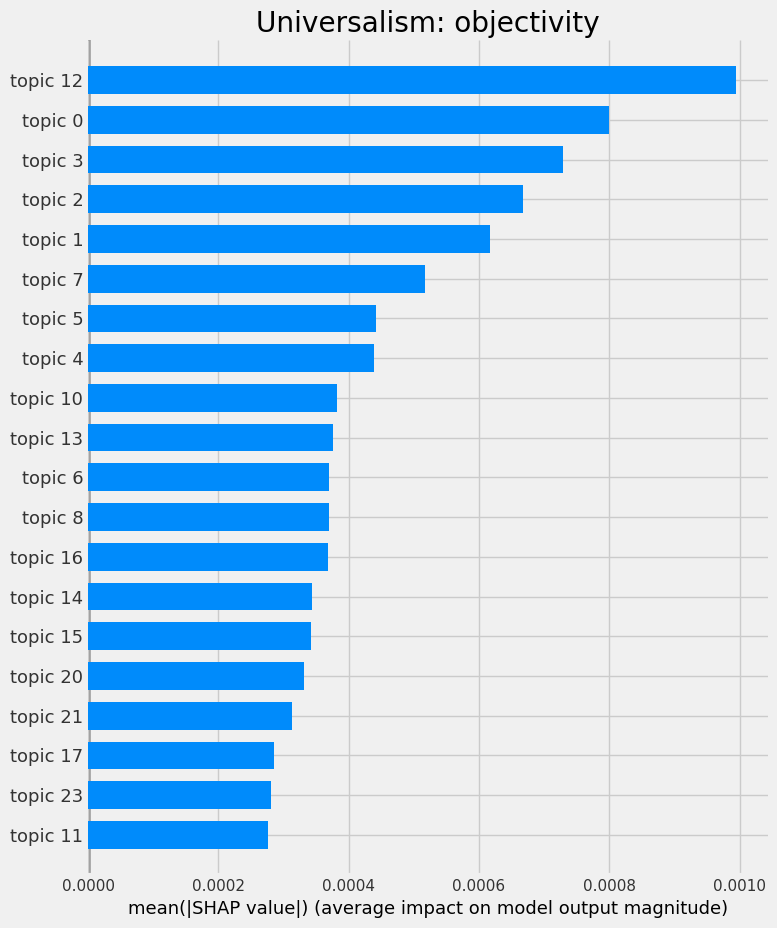

In [130]:
for title_idx, class_idx in zip(range(20), range(1, 40, 2)):
    plt.title(y.columns[title_idx])  # Set the title based on the column name
    shap.summary_plot(shap_values[:, :, class_idx], X_sample, plot_type='bar', show=True)

In [149]:
# Initialize an empty dictionary to store the highest SHAP values
highest_shap_values = {}

for title_idx, class_idx in zip(range(20), range(1, 40, 2)):
    # Compute the SHAP values for the current class index
    shap_values_class = shap_values[:, :, class_idx]

    # Compute the absolute sum of SHAP values for each feature
    shap_values_sum = pd.DataFrame(abs(shap_values_class).sum(axis=0), columns=['SHAP_sum'])

    # Find the feature with the highest SHAP value
    feature_with_highest_shap = shap_values_sum.idxmax()[0]

    # Store the feature with the highest SHAP value for the current title index
    highest_shap_values[y.columns[title_idx]] = feature_with_highest_shap

# Create a DataFrame from the dictionary
df_highest_shap = pd.DataFrame(highest_shap_values.items(), columns=['Value', 'Feature with Highest SHAP Value'])

df_highest_shap.set_index('Value', inplace=True)

Create a dataframe with precision, topic with highest SHAP value, and most correlated topic by human value

In [152]:
precision_df.set_index('Human_Value', inplace=True)
precision_df

,Label,Precision
Human_Value,,
Self-direction: thought,0,0.233871
Self-direction: action,1,0.285714
Stimulation,2,0.181818
Hedonism,3,0.000000
Achievement,4,0.317460
Power: dominance,5,0.130435
Power: resources,6,0.117647
Face,7,0.000000
Security: personal,8,0.510022


In [158]:
## Concatenate precision_df with df_highest_shap and topics (highest_similarity_df)

column_names = ["Topic"]
highest_similarity_df.columns = column_names

summary = highest_similarity_df.merge(precision_df, left_index=True, right_index=True)\
                                .merge(df_highest_shap, left_index=True, right_index=True)

# Rename columns
summary.rename(columns={'Topic': 'Most correlated Topic', 'Feature with Highest SHAP Value': 'Topic with Highest SHAP Value'}, inplace=True)

# Reorder columns
summary = summary[['Label', 'Precision', 'Most correlated Topic', 'Topic with Highest SHAP Value']]

# Sort by Precision
summary.sort_values(by='Precision', inplace=True, ascending=False)

summary

,Label,Precision,Most correlated Topic,Topic with Highest SHAP Value
Universalism: nature,17,0.617647,19,8
Security: personal,8,0.510022,2,4
Universalism: concern,16,0.384770,19,1
Universalism: objectivity,19,0.363636,20,12
Security: societal,9,0.342640,12,7
Tradition,10,0.338235,12,5
Achievement,4,0.317460,2,0
Benevolence: caring,14,0.286408,2,0
Self-direction: action,1,0.285714,20,3
Conformity: interpersonal,12,0.250000,12,0


In [163]:
## Combine with token_presence

# Read dataset
token_presence = pd.read_parquet('/content/drive/MyDrive/DSE_fp_files/token_presence.parquet')

summary_2 = token_presence.merge(summary, left_index=True, right_index=True)
summary_2.sort_values(by='Precision', inplace=True, ascending=False)

summary_2

,allow,anim,ban,caus,child,cosmet,countri,crime,educ,entertain,...,way,weapon,whale,work,would,zoo,Label,Precision,Most correlated Topic,Topic with Highest SHAP Value
Universalism: nature,0,1,1,0,0,0,0,0,0,0,...,0,0,1,0,0,1,17,0.617647,19,8
Security: personal,1,0,1,0,1,0,1,0,0,0,...,0,0,0,0,1,0,8,0.510022,2,4
Universalism: concern,1,0,0,0,1,0,1,0,0,0,...,0,0,0,0,1,0,16,0.384770,19,1
Universalism: objectivity,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,1,0,19,0.363636,20,12
Security: societal,0,0,0,1,0,0,1,1,0,0,...,0,1,0,0,1,0,9,0.342640,12,7
Tradition,0,0,1,0,1,0,1,0,0,0,...,0,0,0,0,0,0,10,0.338235,12,5
Achievement,1,0,0,0,1,0,1,0,1,0,...,0,0,0,1,1,0,4,0.317460,2,0
Benevolence: caring,1,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,14,0.286408,2,0
Self-direction: action,1,0,1,0,1,0,0,0,0,0,...,0,0,0,0,1,0,1,0.285714,20,3
Conformity: interpersonal,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,12,0.250000,12,0


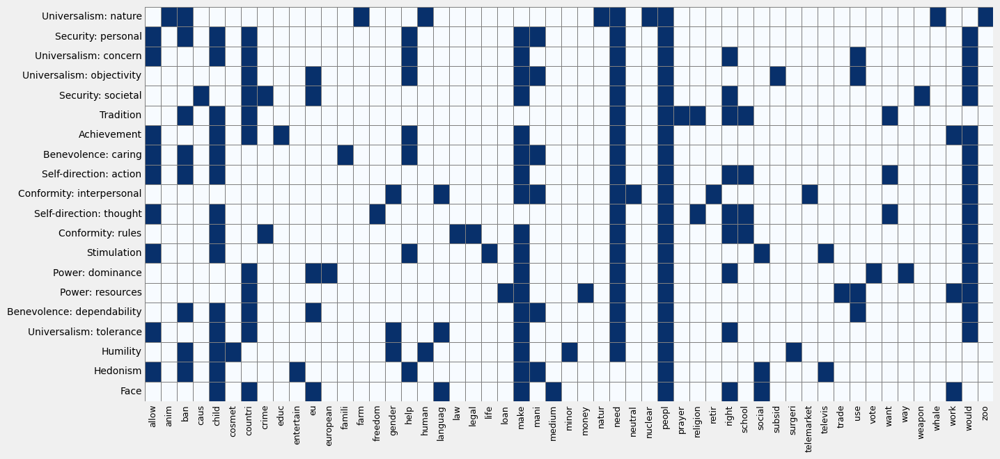

In [168]:
# Create a heatmap with most frequent tokens by human value

plt.figure(figsize=(14, 7))
sns.heatmap(summary_2.iloc[:,0:53], cmap='Blues', cbar=False, linewidths=0.5, linecolor='gray', annot=False)
#plt.title('Shared Tokens Across Human Values')
plt.xlabel('')
plt.ylabel('')
plt.xticks(rotation=90, fontsize=9)
plt.yticks(fontsize=10)
plt.show()